In [1]:
#importing generic libraries
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt

In [ ]:
#Business use case - We shall try to forecast stock using the historic data

In [2]:
#setting working loacation on macos
os.chdir('/Users/utkarshvikas/Downloads/')

In [3]:
#importing deepak sir's file. Ensuring datetime column to transform as index for the dataframe
df=pd.read_csv('deepaksir.csv',parse_dates=True).set_index('Date').drop(['ID','DayOfYear','Day in series','Every3dayperiod','Unnamed: 12'],axis=1)

In [4]:
#this is the original data that has region>City, Category>Price, Qty---->Unitprice-->TotalPrice. So basically 3 blocks of necessary info
df

,Region,City,Category,Product,Qty,UnitPrice,TotalPrice
Date,,,,,,,
2022-01-01,East,Boston,Bars,Carrot,33.0,1.77,58.41
2022-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-01-04,East,Boston,Crackers,Whole Wheat,87.0,3.49,303.63
2022-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
2023-12-27,West,Los Angeles,Bars,Bran,30.0,1.87,56.10
2023-12-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-12-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
#applied this pivot to understand the classes in product and unit price.
df.pivot_table(index=['Product','UnitPrice'])

<ipython-input-5-010b1cc8a821>:1: FutureWarning: pivot_table dropped a column because it failed to aggregate. This behavior is deprecated and will raise in a future version of pandas. Select only the columns that can be aggregated.
  df.pivot_table(index=['Product','UnitPrice'])


Qty  TotalPrice
Product        UnitPrice                       
Arrowroot      2.18       78.870968  171.938710
Banana         2.27       26.333333   59.776667
Bran           1.87       58.333333  109.083333
Carrot         1.77       65.421875  115.796719
Chocolate Chip 1.87       74.090909  138.550000
Oatmeal Raisin 2.84       83.032258  235.811613
Potato Chips   1.35       27.500000   37.125000
               1.68       46.950000   78.876000
Pretzels       3.15       26.571429   83.700000
Whole Wheat    3.49       36.807692  128.458846

In [7]:
#found out that we need to create 2 classes of potatochips as there were 
#2 varieties being sold as per the unit price data

In [9]:
df.loc[df['UnitPrice'] == 1.35, 'Product'] = 'Potato_chips_l'
df.loc[df['UnitPrice'] == 1.68, 'Product'] = 'Potato_chips_h'
df.pivot_table(index=['Product','UnitPrice'])

<ipython-input-9-14d318d83c77>:3: FutureWarning: pivot_table dropped a column because it failed to aggregate. This behavior is deprecated and will raise in a future version of pandas. Select only the columns that can be aggregated.
  df.pivot_table(index=['Product','UnitPrice'])


,,Qty,TotalPrice
Product,UnitPrice,,
Arrowroot,2.18,78.870968,171.938710
Banana,2.27,26.333333,59.776667
Bran,1.87,58.333333,109.083333
Carrot,1.77,65.421875,115.796719
Chocolate Chip,1.87,74.090909,138.550000
Oatmeal Raisin,2.84,83.032258,235.811613
Potato_chips_h,1.68,46.950000,78.876000
Potato_chips_l,1.35,27.500000,37.125000
Pretzels,3.15,26.571429,83.700000


In [11]:
df.pivot_table(index=['City'])

<ipython-input-11-df007e12f985>:1: FutureWarning: pivot_table dropped a column because it failed to aggregate. This behavior is deprecated and will raise in a future version of pandas. Select only the columns that can be aggregated.
  df.pivot_table(index=['City'])


,Qty,TotalPrice,UnitPrice
City,,,
Boston,64.204545,150.744659,2.425909
Los Angeles,68.527273,139.769455,2.037455
New York,64.612903,133.206935,2.090161
San Diego,51.717949,105.484615,2.099231


In [ ]:
#there are 4 cities

In [ ]:
#So, lets combine City and product to build a column of 4*10(maximum potential cases) classes

In [12]:
df_supplies=df
df_supplies['city_product'] = df_supplies['City'] + '_' + df_supplies['Product']

In [13]:
df_supplies

,Region,City,Category,Product,Qty,UnitPrice,TotalPrice,city_product
Date,,,,,,,,
2022-01-01,East,Boston,Bars,Carrot,33.0,1.77,58.41,Boston_Carrot
2022-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-01-04,East,Boston,Crackers,Whole Wheat,87.0,3.49,303.63,Boston_Whole Wheat
2022-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
2023-12-27,West,Los Angeles,Bars,Bran,30.0,1.87,56.10,Los Angeles_Bran
2023-12-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-12-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [15]:
df_supplies.pivot_table(index='city_product').shape
#so what we see is that out of potentially 40 cases possible, we get 31 city_product classes in place. 
#So we have the data almost ready to begin with forecasting analysis

<ipython-input-15-ed6ddd7029cf>:1: FutureWarning: pivot_table dropped a column because it failed to aggregate. This behavior is deprecated and will raise in a future version of pandas. Select only the columns that can be aggregated.
  df_supplies.pivot_table(index='city_product').shape


(31, 3)

In [25]:
#now, we need to wrange our table with visibility across all 730 date values in index column.
# We need to arrange each column with qty sold each day across the 31 classes. 
df_31_730=df_supplies.pivot_table(index='Date',columns='city_product',values='Qty',aggfunc=sum).fillna(0)
df_31_730

city_product,Boston_Arrowroot,Boston_Banana,Boston_Bran,Boston_Carrot,Boston_Chocolate Chip,Boston_Oatmeal Raisin,Boston_Potato_chips_h,Boston_Pretzels,Boston_Whole Wheat,Los Angeles_Arrowroot,...,New York_Potato_chips_h,New York_Potato_chips_l,New York_Whole Wheat,San Diego_Arrowroot,San Diego_Bran,San Diego_Carrot,San Diego_Chocolate Chip,San Diego_Oatmeal Raisin,San Diego_Potato_chips_h,San Diego_Whole Wheat
Date,,,,,,,,,,,,,,,,,,,,,
2022-01-01,0.0,0.0,0.0,33.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,87.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-13,38.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-18,34.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-12-21,0.0,0.0,0.0,0.0,245.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-12-24,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,30.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
#there is a problem. I wanted 780 rows but pivot could give me only 244. So, i will have to construct a dummy dataframe and then use A-B set operation.

In [27]:
df_supplies.tail()

,Region,City,Category,Product,Qty,UnitPrice,TotalPrice,city_product
Date,,,,,,,,
2023-12-27,West,Los Angeles,Bars,Bran,30.0,1.87,56.10,Los Angeles_Bran
2023-12-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-12-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2023-12-30,West,Los Angeles,Cookies,Oatmeal Raisin,44.0,2.84,124.96,Los Angeles_Oatmeal Raisin
2023-12-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [28]:
#lets ust validate that there are no nulls
#0s denote no sales in those days which is a fair assumption
df_31_730.columns

Index(['Boston_Arrowroot', 'Boston_Banana', 'Boston_Bran', 'Boston_Carrot',
       'Boston_Chocolate Chip', 'Boston_Oatmeal Raisin',
       'Boston_Potato_chips_h', 'Boston_Pretzels', 'Boston_Whole Wheat',
       'Los Angeles_Arrowroot', 'Los Angeles_Bran', 'Los Angeles_Carrot',
       'Los Angeles_Chocolate Chip', 'Los Angeles_Oatmeal Raisin',
       'Los Angeles_Potato_chips_h', 'Los Angeles_Whole Wheat',
       'New York_Arrowroot', 'New York_Bran', 'New York_Carrot',
       'New York_Chocolate Chip', 'New York_Oatmeal Raisin',
       'New York_Potato_chips_h', 'New York_Potato_chips_l',
       'New York_Whole Wheat', 'San Diego_Arrowroot', 'San Diego_Bran',
       'San Diego_Carrot', 'San Diego_Chocolate Chip',
       'San Diego_Oatmeal Raisin', 'San Diego_Potato_chips_h',
       'San Diego_Whole Wheat'],
      dtype='object', name='city_product')

In [29]:
#creating dummy dataframe
import pandas as pd

# create a date range for the index
date_range = pd.date_range(start='2022-01-01', end='2023-12-31', freq='D')

# create an empty DataFrame with the date range as index and the required columns
columns = ['Boston_Arrowroot', 'Boston_Banana', 'Boston_Bran', 'Boston_Carrot', 'Boston_Chocolate Chip',
           'Boston_Oatmeal Raisin', 'Boston_Potato_chips_h', 'Boston_Pretzels', 'Boston_Whole Wheat',
           'Los Angeles_Arrowroot', 'Los Angeles_Bran', 'Los Angeles_Carrot', 'Los Angeles_Chocolate Chip',
           'Los Angeles_Oatmeal Raisin', 'Los Angeles_Potato_chips_h', 'Los Angeles_Whole Wheat',
           'New York_Arrowroot', 'New York_Bran', 'New York_Carrot', 'New York_Chocolate Chip',
           'New York_Oatmeal Raisin', 'New York_Potato_chips_h', 'New York_Potato_chips_l', 'New York_Whole Wheat',
           'San Diego_Arrowroot', 'San Diego_Bran', 'San Diego_Carrot', 'San Diego_Chocolate Chip',
           'San Diego_Oatmeal Raisin', 'San Diego_Potato_chips_h', 'San Diego_Whole Wheat']
df_dummy = pd.DataFrame(index=date_range, columns=columns).fillna(0)

In [33]:
df_dummy.shape

(730, 31)

In [37]:
df_31_730.index

Index(['2022-01-01', '2022-01-04', '2022-01-07', '2022-01-10', '2022-01-13',
       '2022-01-16', '2022-01-19', '2022-01-22', '2022-01-25', '2022-01-28',
       ...
       '2023-12-03', '2023-12-06', '2023-12-09', '2023-12-12', '2023-12-15',
       '2023-12-18', '2023-12-21', '2023-12-24', '2023-12-27', '2023-12-30'],
      dtype='object', name='Date', length=244)

In [46]:
df_dummy_new = df_dummy[~df_dummy.index.isin(df_31_730.index)]

# concatenate df_31_730 with df_dummy_new
result = pd.concat([df_31_730, df_dummy_new])
result = result.sort_index()
result
#So, now we have got the 730*31 df that has qty sold at each date for all the city-product combination. 

,Boston_Arrowroot,Boston_Banana,Boston_Bran,Boston_Carrot,Boston_Chocolate Chip,Boston_Oatmeal Raisin,Boston_Potato_chips_h,Boston_Pretzels,Boston_Whole Wheat,Los Angeles_Arrowroot,...,New York_Potato_chips_h,New York_Potato_chips_l,New York_Whole Wheat,San Diego_Arrowroot,San Diego_Bran,San Diego_Carrot,San Diego_Chocolate Chip,San Diego_Oatmeal Raisin,San Diego_Potato_chips_h,San Diego_Whole Wheat
2022-01-01,0.0,0.0,0.0,33.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,87.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-27,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-12-28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-12-29,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-12-30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [299]:
result.pivot_table(index='Boston_Banana')

,Boston_Arrowroot,Boston_Bran,Boston_Carrot,Boston_Chocolate Chip,Boston_Oatmeal Raisin,Boston_Potato_chips_h,Boston_Pretzels,Boston_Whole Wheat,Los Angeles_Arrowroot,Los Angeles_Bran,...,New York_Potato_chips_h,New York_Potato_chips_l,New York_Whole Wheat,San Diego_Arrowroot,San Diego_Bran,San Diego_Carrot,San Diego_Chocolate Chip,San Diego_Oatmeal Raisin,San Diego_Potato_chips_h,San Diego_Whole Wheat
Boston_Banana,,,,,,,,,,,,,,,,,,,,,
0.0,1.210454,0.642366,1.762036,0.883081,1.628611,0.281981,0.255846,0.998624,0.25447,0.480055,...,0.372765,0.075653,0.193948,0.620358,0.269601,0.72077,0.682256,0.277854,0.137552,0.066025
22.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
27.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
30.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000


In [47]:
result_df=result
#lets look at how the historical data looks like across the dates for each of the columns

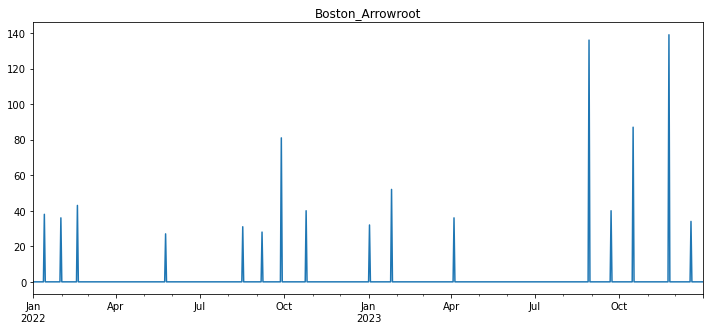

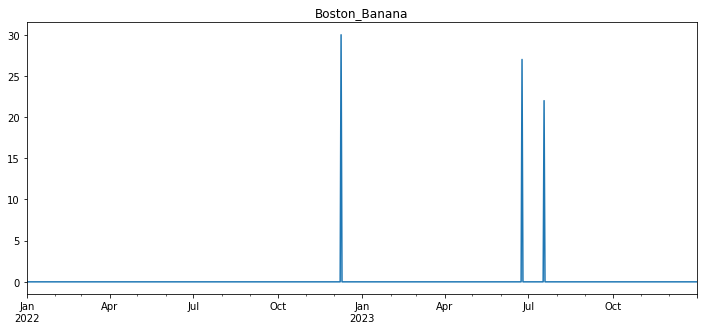

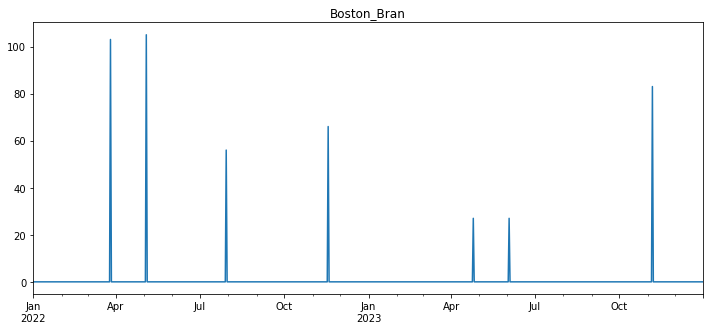

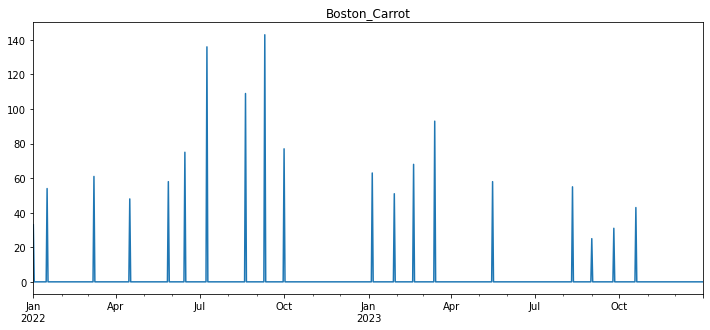

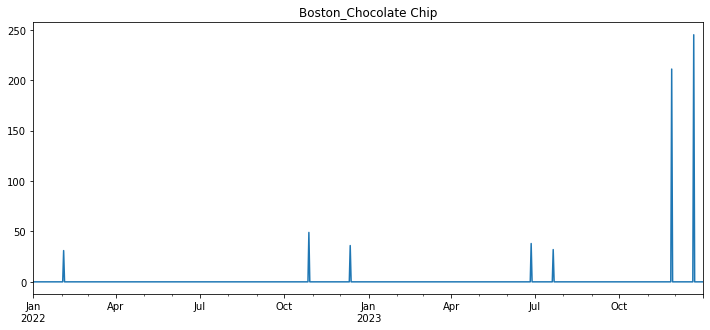

...

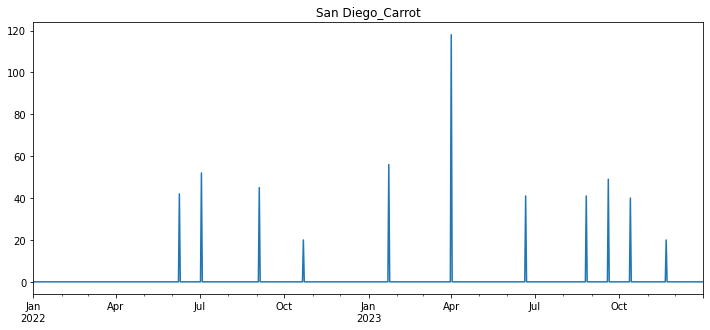

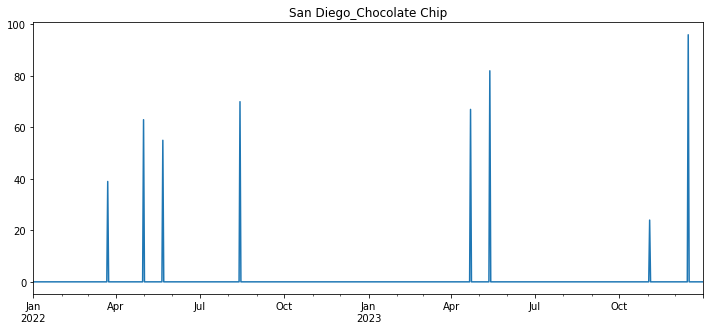

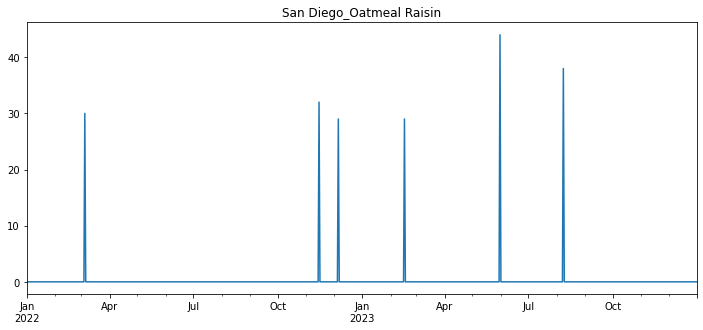

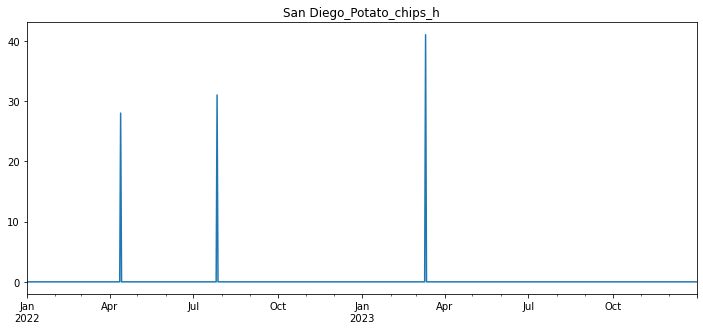

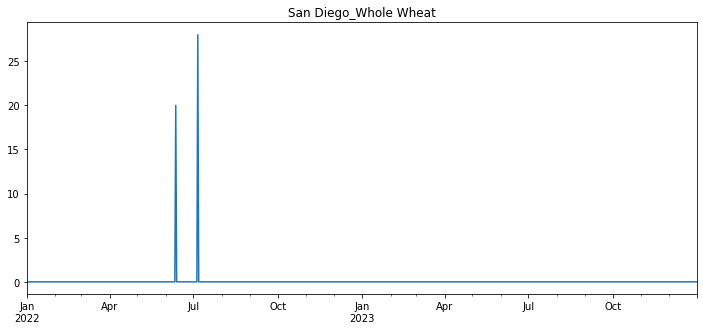

In [48]:
# Iterate over columns in df_31 - basically over combinations of city and product
for column in result_df.columns:
    # Create a boolean mask to select non-null and non-zero values in the column
    mask = (result_df[column].notnull())
    # Create a new figure and axis object
    fig, ax = plt.subplots(figsize=(12,5))
    # Plot the non-null and non-zero values of the column on the axis
    result_df.loc[mask, column].plot(ax=ax)
    # Set the title of the graph
    ax.set_title(column)
    # Show the graph
    plt.show()

In [49]:
#Now lets try using Sarimax and looks at how well it is able to forecast from the values
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [50]:
# Select the column to be extrapolated
#column_to_extrapolate = 'San Diego_Carrot'
df=result_df

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


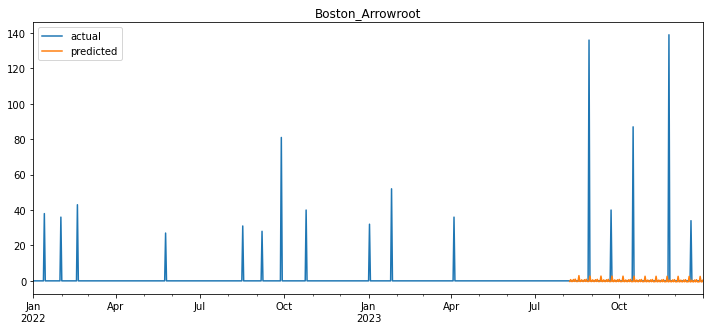

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


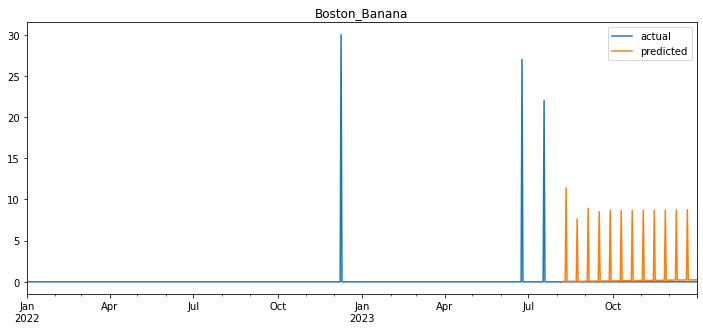

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


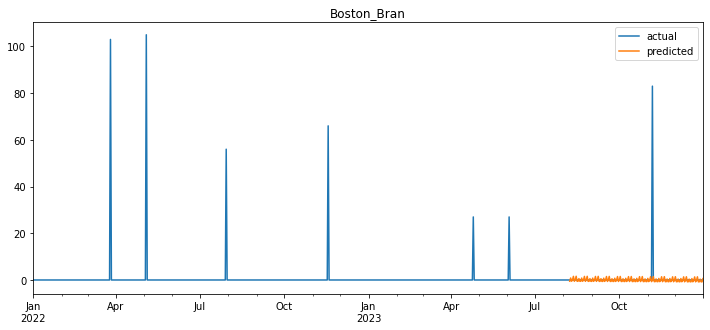

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


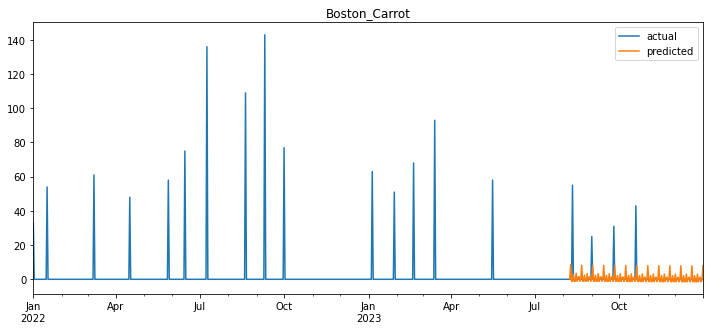

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


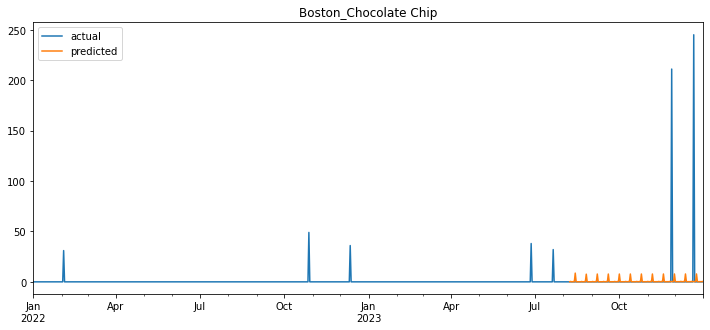

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


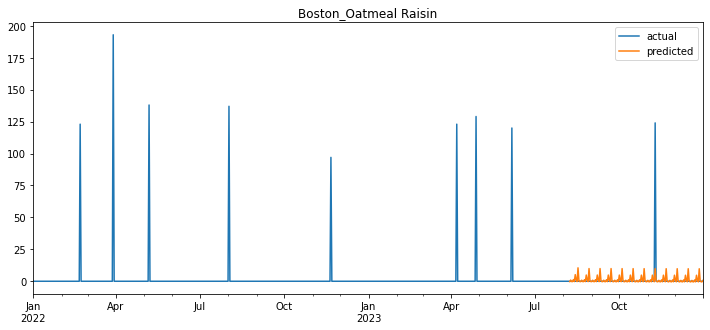

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


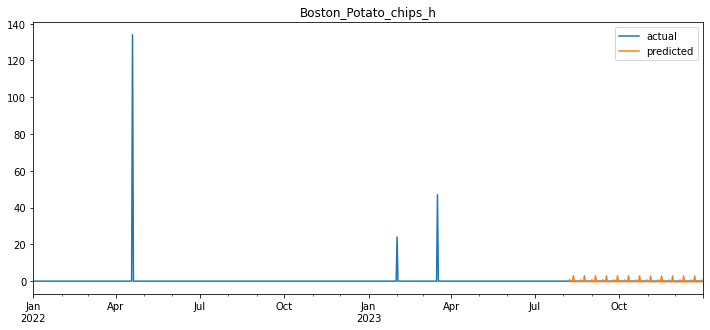

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


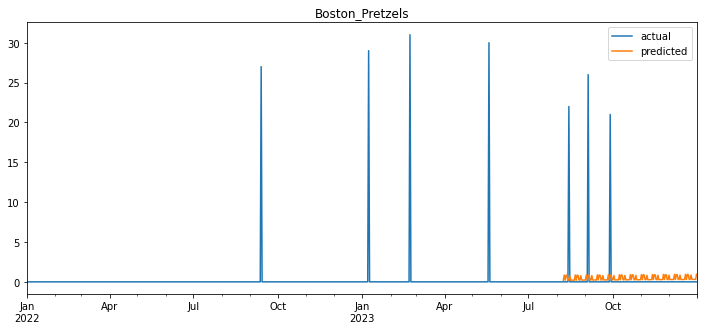

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


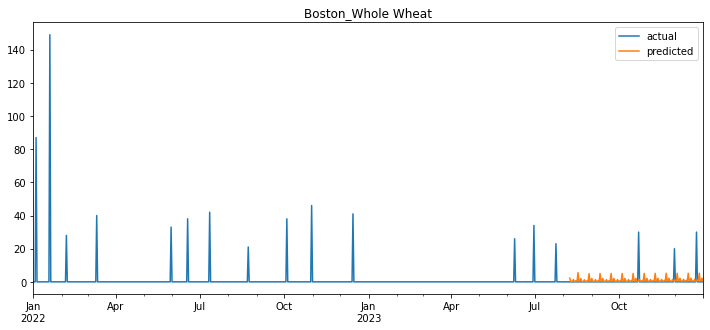

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


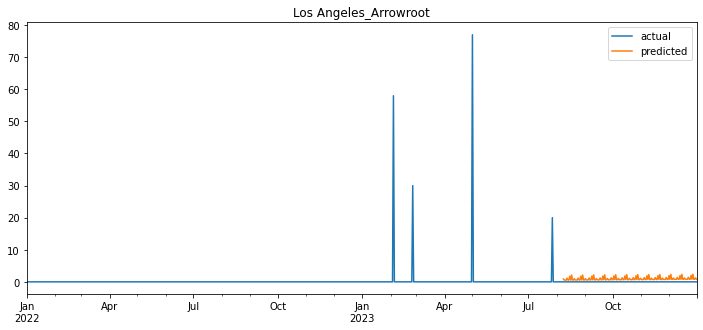

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


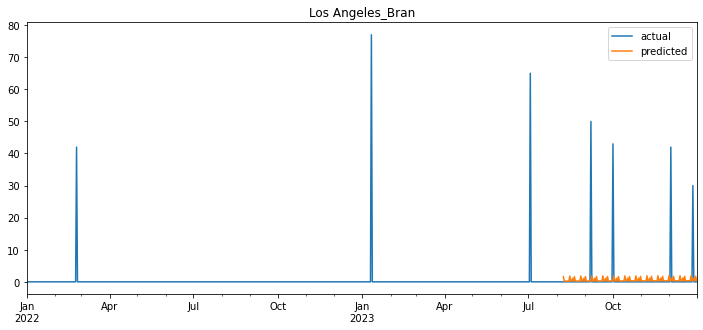

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


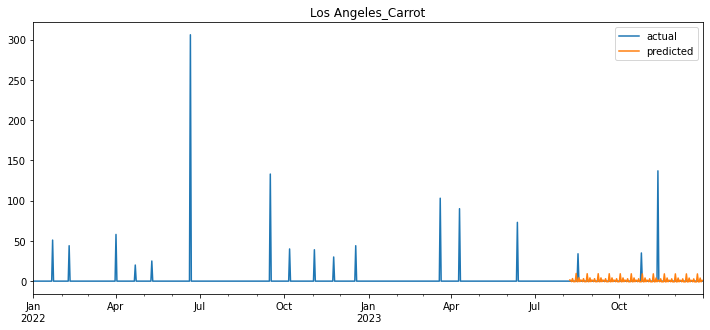

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


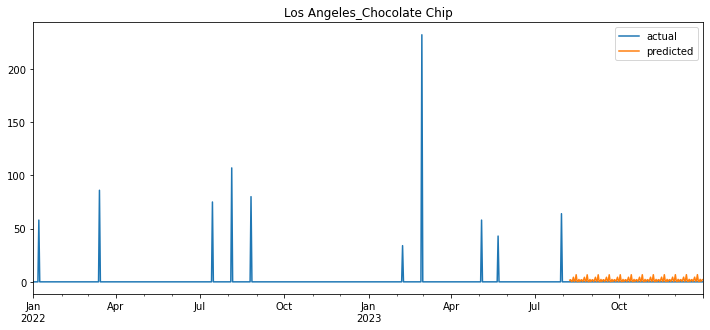

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


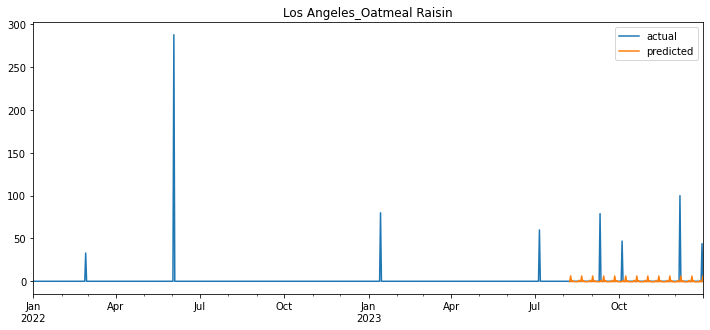

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


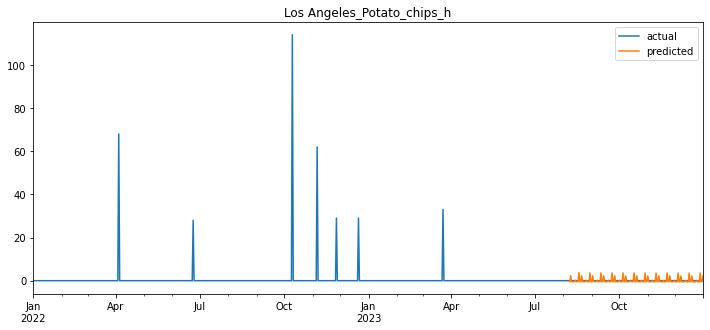

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


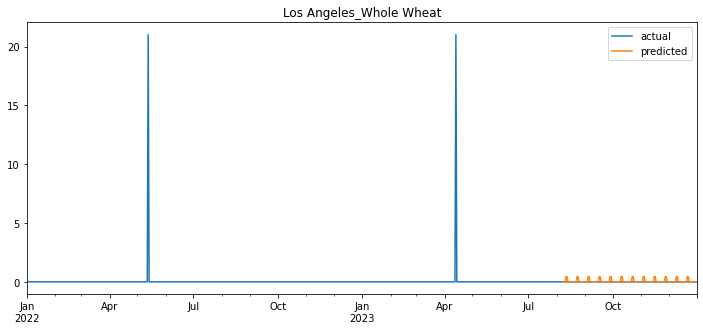

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


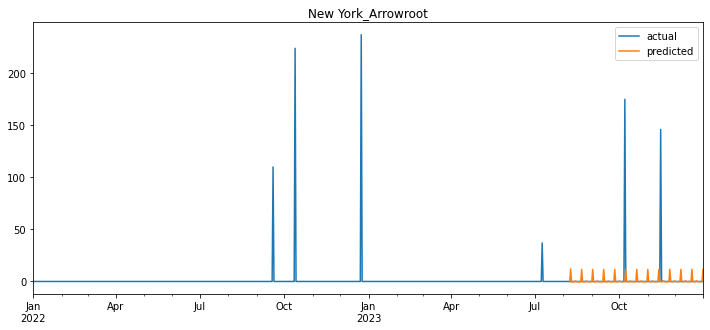

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


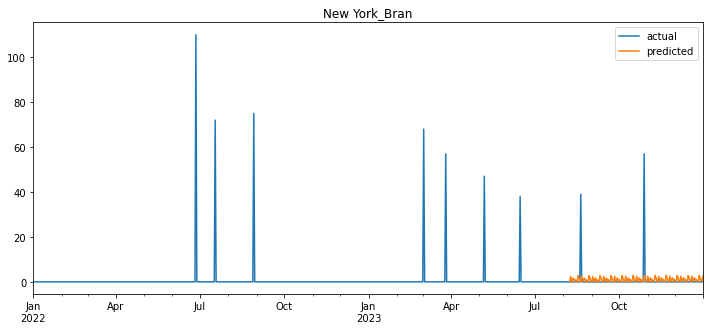

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


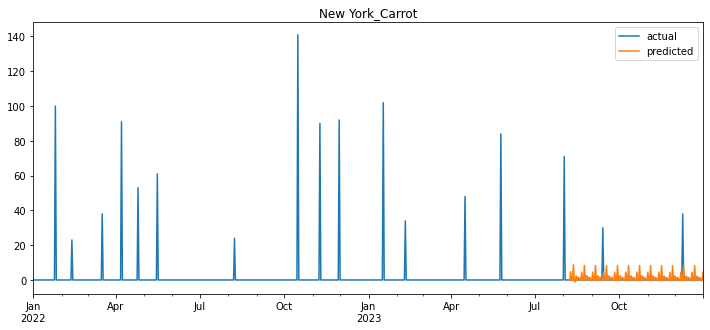

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


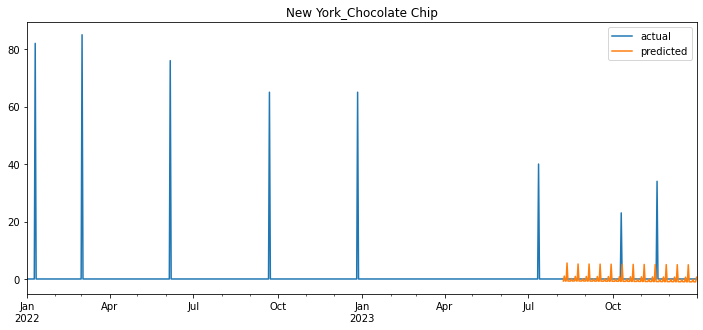

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


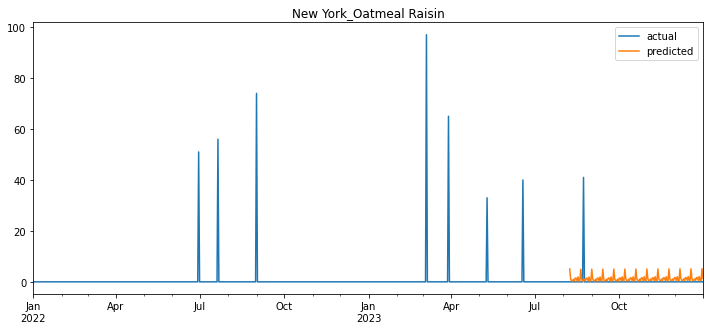

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


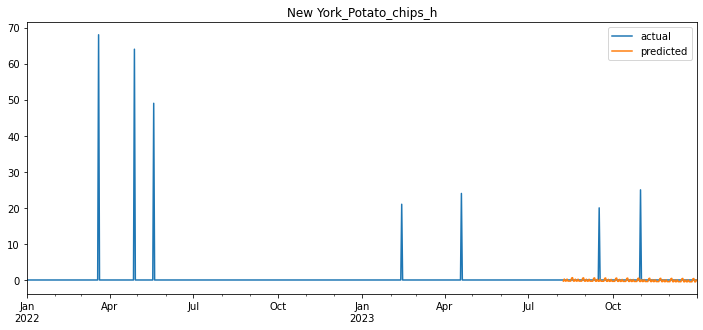

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


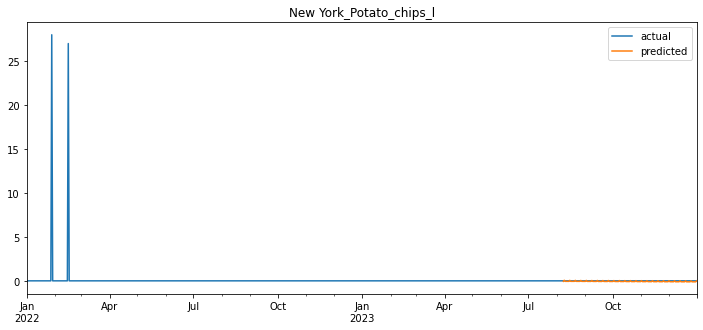

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


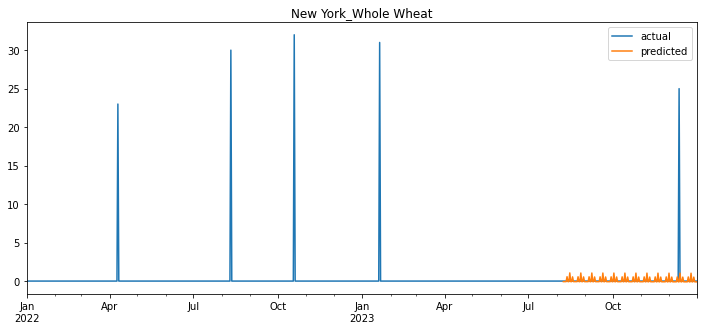

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


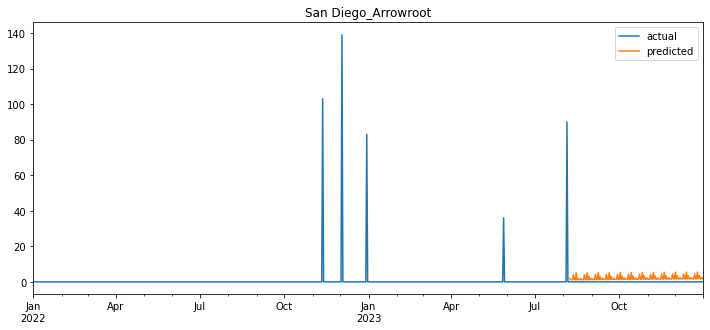

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


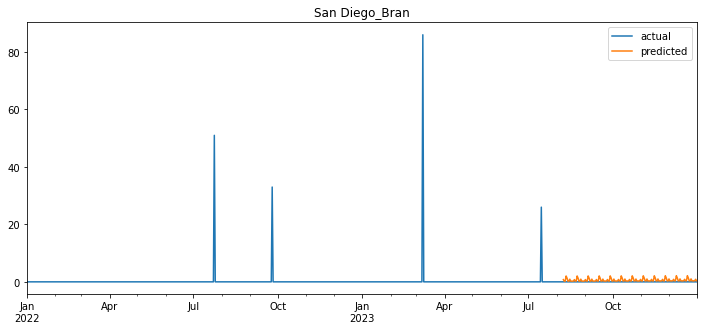

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


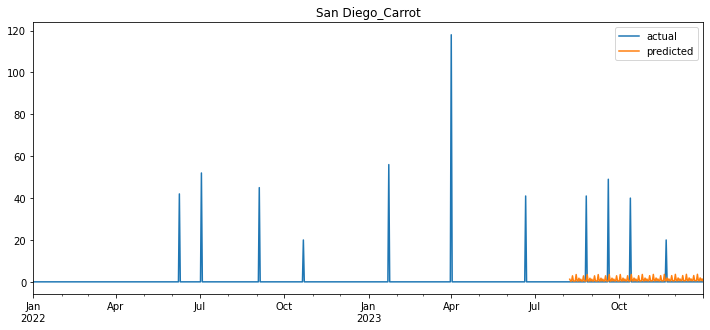

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


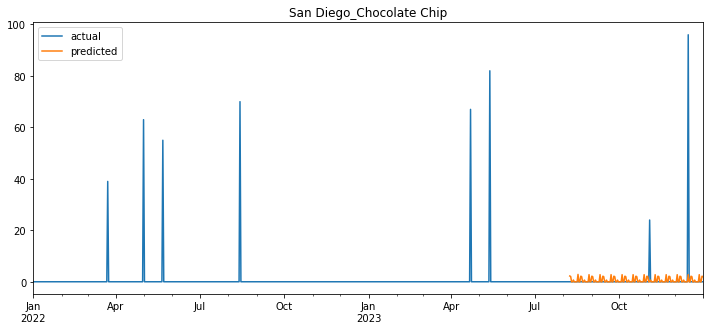

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


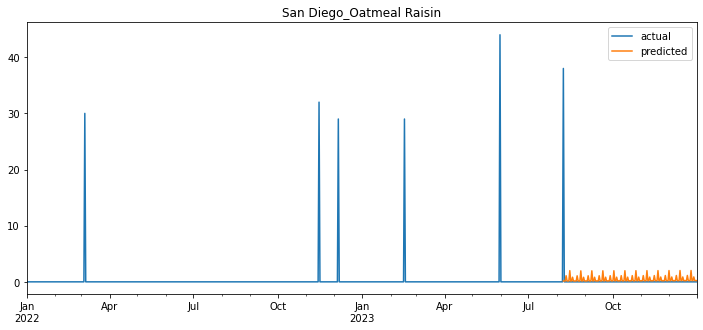

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


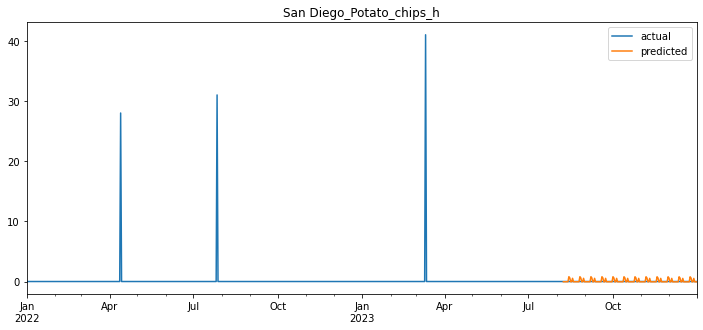

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


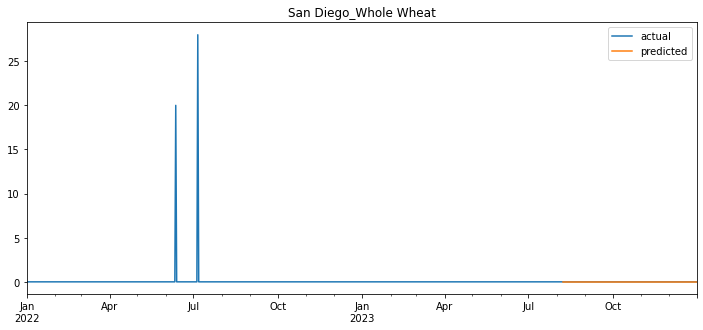

In [51]:
# Split the data into train and test sets
train_size = int(len(df) * 0.8)
train_data, test_data = df[:train_size], df[train_size:]

# Loop over all columns in the dataframe
for column in df.columns:
    # Fit a SARIMA model to the training data of the current column
    model = SARIMAX(train_data[column], order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
    results = model.fit()

    # Extrapolate the values for the test period
    start_index = len(train_data)
    end_index = len(df) - 1
    predicted_values = results.predict(start=start_index, end=end_index, dynamic=False)

    # Combine the original and predicted values into a single dataframe
    df_extrapolated = pd.concat([df[column], predicted_values], axis=1)
    df_extrapolated.columns = ['actual', 'predicted']

    # Plot the actual and predicted values on a graph
    fig, ax = plt.subplots(figsize=(12,5))
    df_extrapolated.plot(ax=ax)
    ax.set_title(column)
    plt.show()

In [ ]:
#sarima is not giving us good forecast as we can see.
#we will have to capture sequence of occurence of the values across each rows and then do this.
#Traditional algos will not help in predciting correct stock

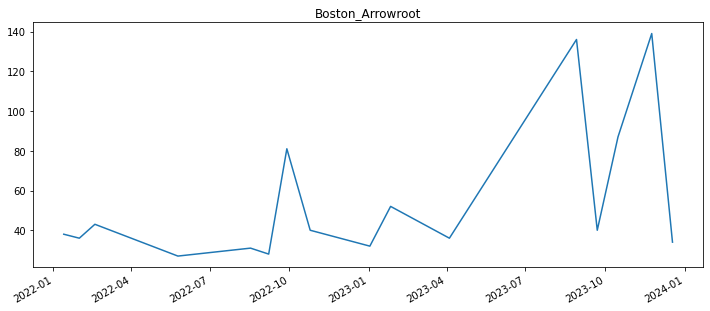

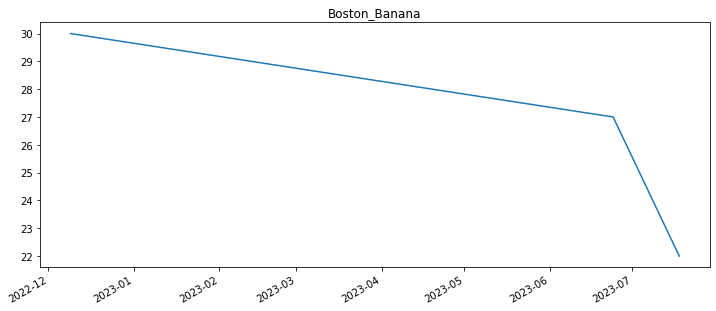

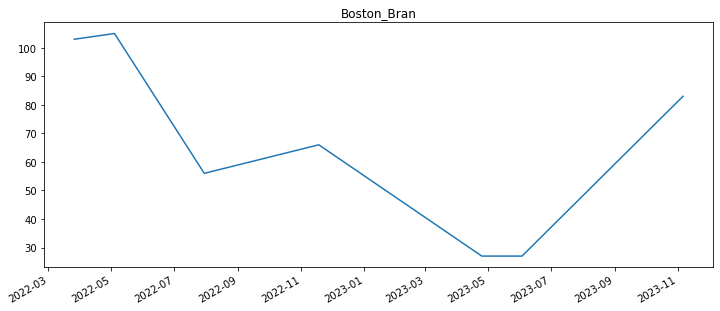

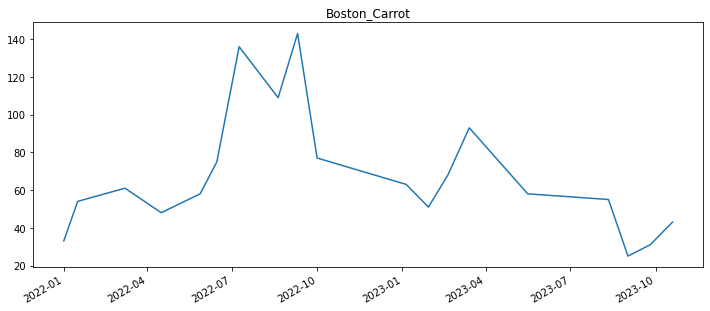

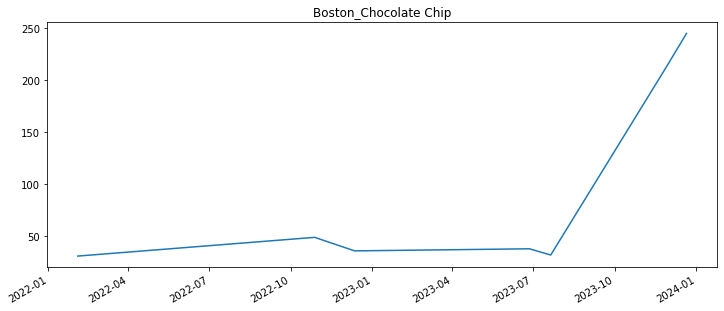

...

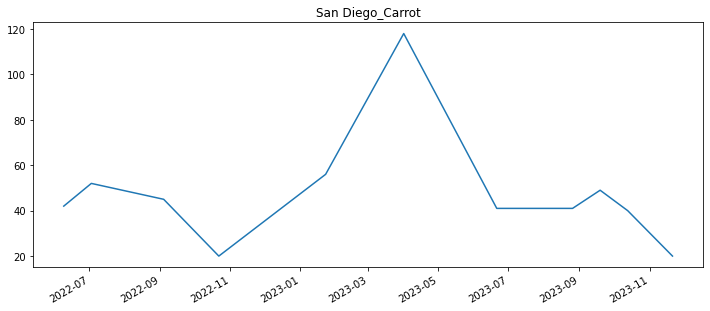

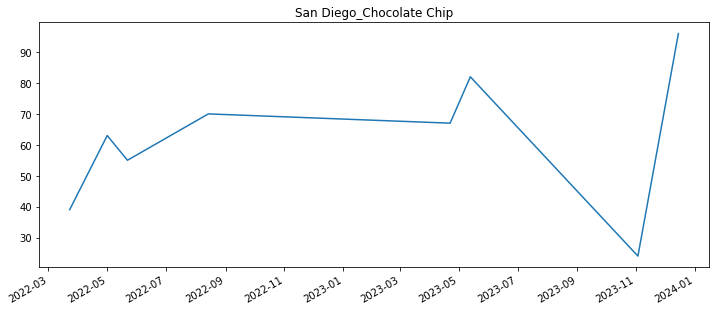

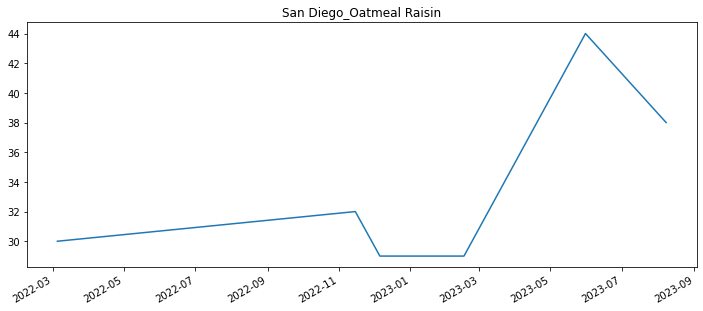

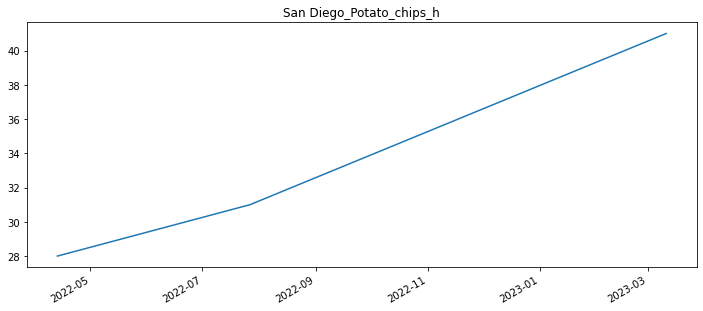

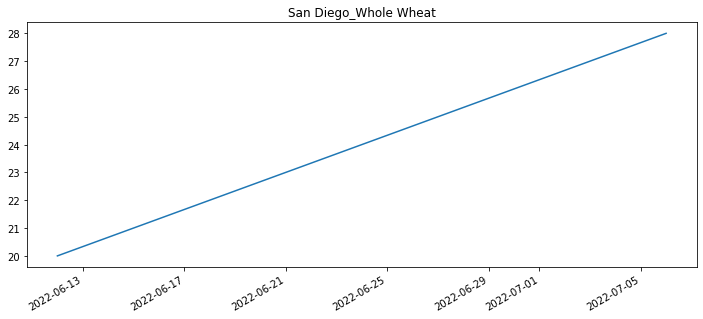

In [52]:
# So, what we will also try to do is try to look at the graphs assuming no dark days in between. This is going to help us later
for column in result_df.columns:
    # Create a boolean mask to select non-null and non-zero values in the column
    mask = (result_df[column].notnull()) & (result_df[column] != 0)
    # Create a new figure and axis object
    fig, ax = plt.subplots(figsize=(12,5))
    # Plot the non-null and non-zero values of the column on the axis
    result_df.loc[mask, column].plot(ax=ax)
    # Set the title of the graph
    ax.set_title(column)
    # Show the graph
    plt.show()

In [60]:
new_df = pd.DataFrame(0, index=df.index, columns=df.columns)

for col in result_df.columns:
    non_zero_indices = np.where(result_df[col] != 0)[0]
    for i in range(len(non_zero_indices)):
        new_df.iloc[non_zero_indices[i], new_df.columns.get_loc(col)] = non_zero_indices[i]

new_df.index.name = result_df.index.name
new_df.columns.name = result_df.columns.name

In [63]:
new_df.pivot_table(index='Boston_Banana')

,Boston_Arrowroot,Boston_Bran,Boston_Carrot,Boston_Chocolate Chip,Boston_Oatmeal Raisin,Boston_Potato_chips_h,Boston_Pretzels,Boston_Whole Wheat,Los Angeles_Arrowroot,Los Angeles_Bran,...,New York_Potato_chips_h,New York_Potato_chips_l,New York_Whole Wheat,San Diego_Arrowroot,San Diego_Bran,San Diego_Carrot,San Diego_Chocolate Chip,San Diego_Oatmeal Raisin,San Diego_Potato_chips_h,San Diego_Whole Wheat
Boston_Banana,,,,,,,,,,,,,,,,,,,,,
0,7.96011,3.313618,8.30674,4.401651,4.046768,1.298487,4.65337,7.584594,2.580468,5.02751,...,3.445667,0.099037,2.34663,2.898212,2.011004,6.639615,4.022008,3.0674,1.022008,0.47868
342,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.00000
539,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.00000
563,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.00000


In [64]:
df_occurence=new_df
#Now I have got a df that has those indices inside cells that denote the count at which the values occur.


In [ ]:
#Next 
# 1. I need to regress this new df by perhpaps 30 more rows along with date with mask
# 2. I need to then regress the values across all columns in the df_31_730 table but with mask and regress from the latest regressable point

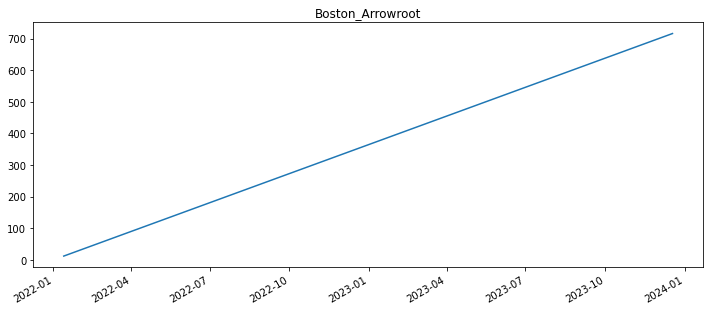

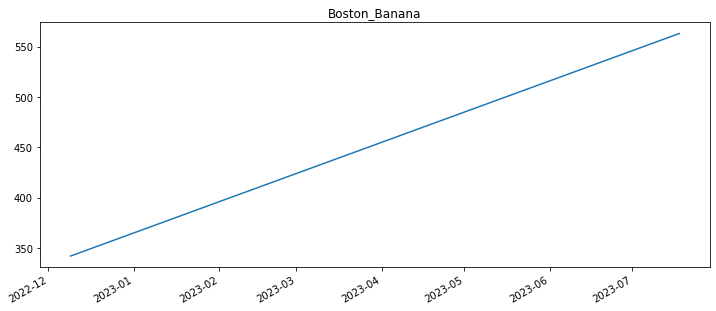

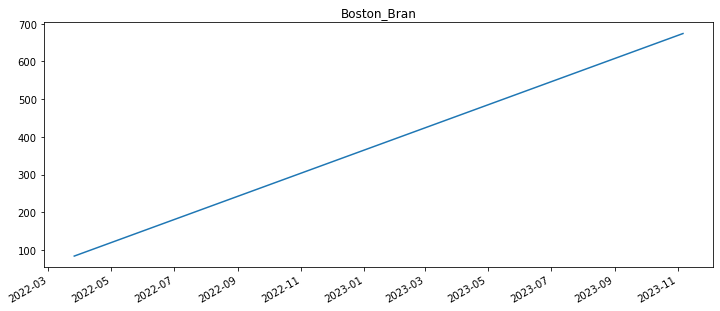

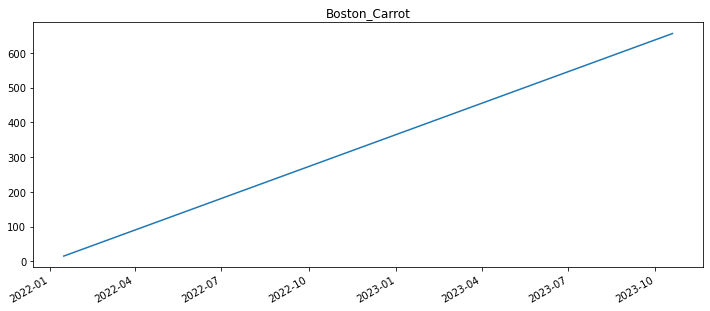

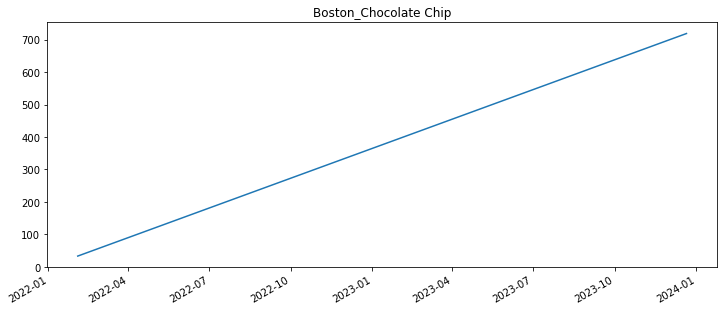

...

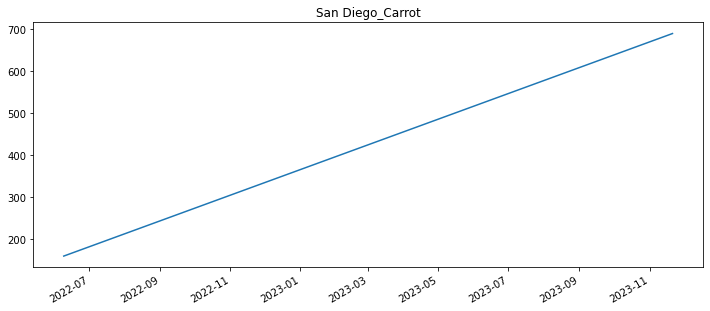

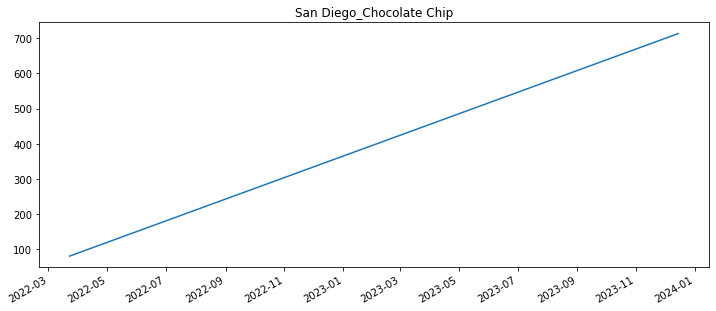

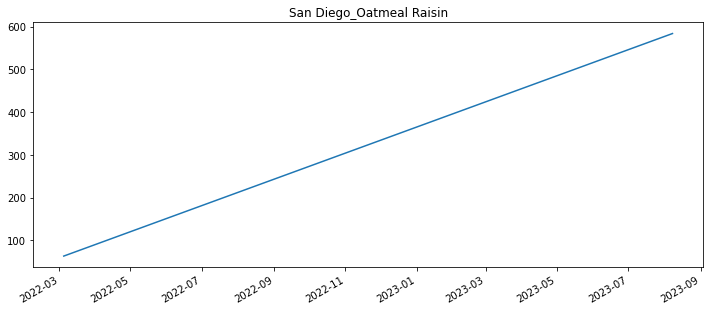

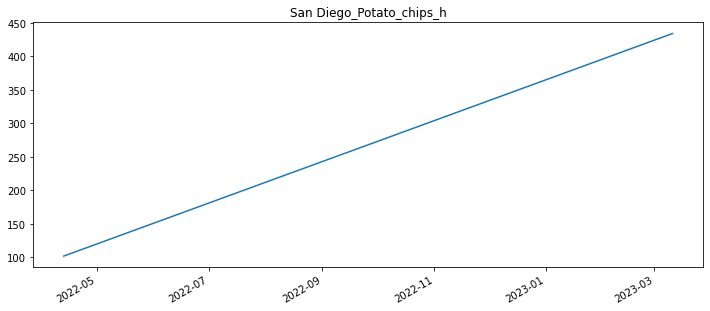

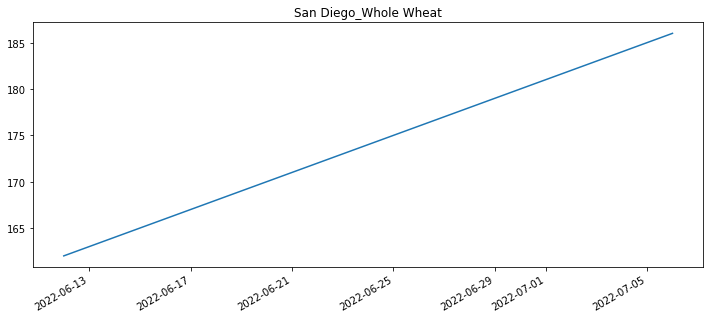

In [67]:
# So, what we will also try to do is try to look at the graphs assuming no dark days in between. This is going to help us later
for column in df_occurence.columns:
    # Create a boolean mask to select non-null and non-zero values in the column
    mask = (df_occurence[column].notnull()) & (df_occurence[column] != 0)
    # Create a new figure and axis object
    fig, ax = plt.subplots(figsize=(12,5))
    # Plot the non-null and non-zero values of the column on the axis
    df_occurence.loc[mask, column].plot(ax=ax)
    # Set the title of the graph
    ax.set_title(column)
    # Show the graph
    plt.show()

In [ ]:
# As we can see, there is a clear regression pattern here. 

In [169]:
df_occurence

,Boston_Arrowroot,Boston_Banana,Boston_Bran,Boston_Carrot,Boston_Chocolate Chip,Boston_Oatmeal Raisin,Boston_Potato_chips_h,Boston_Pretzels,Boston_Whole Wheat,Los Angeles_Arrowroot,...,New York_Potato_chips_h,New York_Potato_chips_l,New York_Whole Wheat,San Diego_Arrowroot,San Diego_Bran,San Diego_Carrot,San Diego_Chocolate Chip,San Diego_Oatmeal Raisin,San Diego_Potato_chips_h,San Diego_Whole Wheat
2022-01-01,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2022-01-02,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2022-01-03,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2022-01-04,0,0,0,0,0,0,0,0,3,0,...,0,0,0,0,0,0,0,0,0,0
2022-01-05,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-27,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2023-12-28,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2023-12-29,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2023-12-30,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [172]:
df_occurence.pivot_table(index='Boston_Banana',aggfunc='count')



,Boston_Arrowroot,Boston_Bran,Boston_Carrot,Boston_Chocolate Chip,Boston_Oatmeal Raisin,Boston_Potato_chips_h,Boston_Pretzels,Boston_Whole Wheat,Los Angeles_Arrowroot,Los Angeles_Bran,...,New York_Potato_chips_h,New York_Potato_chips_l,New York_Whole Wheat,San Diego_Arrowroot,San Diego_Bran,San Diego_Carrot,San Diego_Chocolate Chip,San Diego_Oatmeal Raisin,San Diego_Potato_chips_h,San Diego_Whole Wheat
Boston_Banana,,,,,,,,,,,,,,,,,,,,,
0,727,727,727,727,727,727,727,727,727,727,...,727,727,727,727,727,727,727,727,727,727
342,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
539,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
563,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1


In [262]:
#df_occurence
#df_instnc_fore

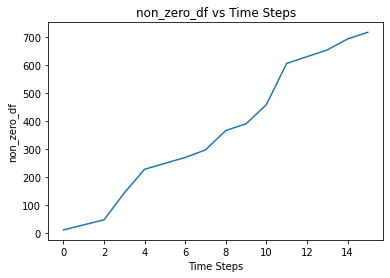

Enter a value: 11
     Boston_Arrowroot Boston_Banana Boston_Bran Boston_Carrot  \
row                                                             
0               744.0           NaN         NaN           NaN   
1               773.0           NaN         NaN           NaN   
2               802.0           NaN         NaN           NaN   
3               830.0           NaN         NaN           NaN   
4               859.0           NaN         NaN           NaN   
5               887.0           NaN         NaN           NaN   
6               916.0           NaN         NaN           NaN   
7               944.0           NaN         NaN           NaN   
8               973.0           NaN         NaN           NaN   
9              1001.0           NaN         NaN           NaN   
10             1030.0           NaN         NaN           NaN   
11             1058.0           NaN         NaN           NaN   
12             1087.0           NaN         NaN           NaN   
13     

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


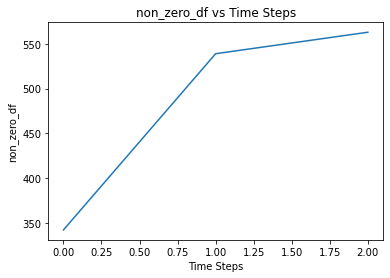

Enter a value: 1
     Boston_Arrowroot  Boston_Banana Boston_Bran Boston_Carrot  \
row                                                              
0               744.0          587.0         NaN           NaN   
1               773.0          611.0         NaN           NaN   
2               802.0          635.0         NaN           NaN   
3               830.0          659.0         NaN           NaN   
4               859.0          683.0         NaN           NaN   
5               887.0          707.0         NaN           NaN   
6               916.0          731.0         NaN           NaN   
7               944.0          755.0         NaN           NaN   
8               973.0          779.0         NaN           NaN   
9              1001.0          803.0         NaN           NaN   
10             1030.0          827.0         NaN           NaN   
11             1058.0          851.0         NaN           NaN   
12             1087.0          875.0         NaN           

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


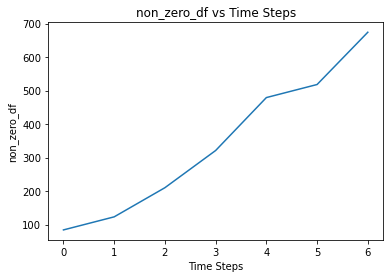

Enter a value: 5


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


     Boston_Arrowroot  Boston_Banana  Boston_Bran Boston_Carrot  \
row                                                               
0               744.0          587.0        830.0           NaN   
1               773.0          611.0        986.0           NaN   
2               802.0          635.0       1142.0           NaN   
3               830.0          659.0       1298.0           NaN   
4               859.0          683.0       1454.0           NaN   
5               887.0          707.0       1610.0           NaN   
6               916.0          731.0       1766.0           NaN   
7               944.0          755.0       1922.0           NaN   
8               973.0          779.0       2078.0           NaN   
9              1001.0          803.0       2234.0           NaN   
10             1030.0          827.0       2390.0           NaN   
11             1058.0          851.0       2546.0           NaN   
12             1087.0          875.0       2702.0           Na

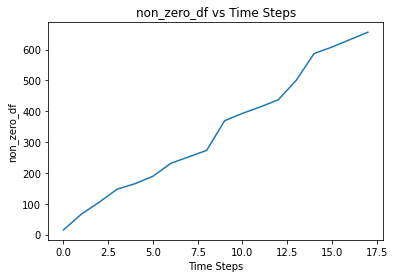

Enter a value: 14
     Boston_Arrowroot  Boston_Banana  Boston_Bran  Boston_Carrot  \
row                                                                
0               744.0          587.0        830.0          678.0   
1               773.0          611.0        986.0          702.0   
2               802.0          635.0       1142.0          725.0   
3               830.0          659.0       1298.0          748.0   
4               859.0          683.0       1454.0          771.0   
5               887.0          707.0       1610.0          794.0   
6               916.0          731.0       1766.0          817.0   
7               944.0          755.0       1922.0          840.0   
8               973.0          779.0       2078.0          863.0   
9              1001.0          803.0       2234.0          886.0   
10             1030.0          827.0       2390.0          909.0   
11             1058.0          851.0       2546.0          933.0   
12             1087.0         

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


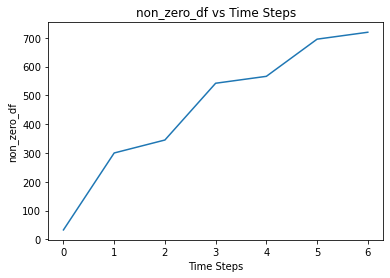

Enter a value: 5


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


     Boston_Arrowroot  Boston_Banana  Boston_Bran  Boston_Carrot  \
row                                                                
0               744.0          587.0        830.0          678.0   
1               773.0          611.0        986.0          702.0   
2               802.0          635.0       1142.0          725.0   
3               830.0          659.0       1298.0          748.0   
4               859.0          683.0       1454.0          771.0   
5               887.0          707.0       1610.0          794.0   
6               916.0          731.0       1766.0          817.0   
7               944.0          755.0       1922.0          840.0   
8               973.0          779.0       2078.0          863.0   
9              1001.0          803.0       2234.0          886.0   
10             1030.0          827.0       2390.0          909.0   
11             1058.0          851.0       2546.0          933.0   
12             1087.0          875.0       2702.

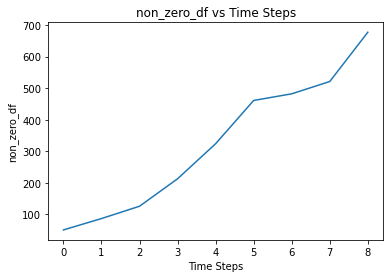

Enter a value: 7


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


     Boston_Arrowroot  Boston_Banana  Boston_Bran  Boston_Carrot  \
row                                                                
0               744.0          587.0        830.0          678.0   
1               773.0          611.0        986.0          702.0   
2               802.0          635.0       1142.0          725.0   
3               830.0          659.0       1298.0          748.0   
4               859.0          683.0       1454.0          771.0   
5               887.0          707.0       1610.0          794.0   
6               916.0          731.0       1766.0          817.0   
7               944.0          755.0       1922.0          840.0   
8               973.0          779.0       2078.0          863.0   
9              1001.0          803.0       2234.0          886.0   
10             1030.0          827.0       2390.0          909.0   
11             1058.0          851.0       2546.0          933.0   
12             1087.0          875.0       2702.

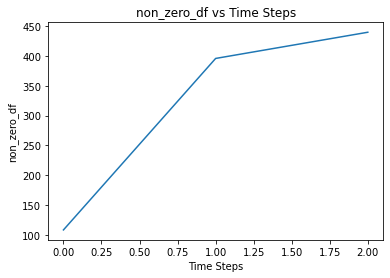

Enter a value: 1
     Boston_Arrowroot  Boston_Banana  Boston_Bran  Boston_Carrot  \
row                                                                
0               744.0          587.0        830.0          678.0   
1               773.0          611.0        986.0          702.0   
2               802.0          635.0       1142.0          725.0   
3               830.0          659.0       1298.0          748.0   
4               859.0          683.0       1454.0          771.0   
5               887.0          707.0       1610.0          794.0   
6               916.0          731.0       1766.0          817.0   
7               944.0          755.0       1922.0          840.0   
8               973.0          779.0       2078.0          863.0   
9              1001.0          803.0       2234.0          886.0   
10             1030.0          827.0       2390.0          909.0   
11             1058.0          851.0       2546.0          933.0   
12             1087.0          

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


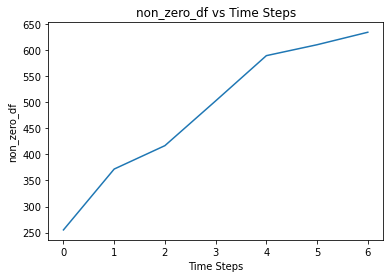

Enter a value: 4
     Boston_Arrowroot  Boston_Banana  Boston_Bran  Boston_Carrot  \
row                                                                
0               744.0          587.0        830.0          678.0   
1               773.0          611.0        986.0          702.0   
2               802.0          635.0       1142.0          725.0   
3               830.0          659.0       1298.0          748.0   
4               859.0          683.0       1454.0          771.0   
5               887.0          707.0       1610.0          794.0   
6               916.0          731.0       1766.0          817.0   
7               944.0          755.0       1922.0          840.0   
8               973.0          779.0       2078.0          863.0   
9              1001.0          803.0       2234.0          886.0   
10             1030.0          827.0       2390.0          909.0   
11             1058.0          851.0       2546.0          933.0   
12             1087.0          

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


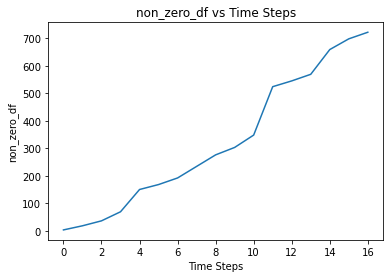

Enter a value: 14
     Boston_Arrowroot  Boston_Banana  Boston_Bran  Boston_Carrot  \
row                                                                
0               744.0          587.0        830.0          678.0   
1               773.0          611.0        986.0          702.0   
2               802.0          635.0       1142.0          725.0   
3               830.0          659.0       1298.0          748.0   
4               859.0          683.0       1454.0          771.0   
5               887.0          707.0       1610.0          794.0   
6               916.0          731.0       1766.0          817.0   
7               944.0          755.0       1922.0          840.0   
8               973.0          779.0       2078.0          863.0   
9              1001.0          803.0       2234.0          886.0   
10             1030.0          827.0       2390.0          909.0   
11             1058.0          851.0       2546.0          933.0   
12             1087.0         

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


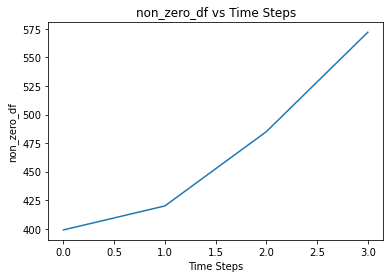

Enter a value: 1
     Boston_Arrowroot  Boston_Banana  Boston_Bran  Boston_Carrot  \
row                                                                
0               744.0          587.0        830.0          678.0   
1               773.0          611.0        986.0          702.0   
2               802.0          635.0       1142.0          725.0   
3               830.0          659.0       1298.0          748.0   
4               859.0          683.0       1454.0          771.0   
5               887.0          707.0       1610.0          794.0   
6               916.0          731.0       1766.0          817.0   
7               944.0          755.0       1922.0          840.0   
8               973.0          779.0       2078.0          863.0   
9              1001.0          803.0       2234.0          886.0   
10             1030.0          827.0       2390.0          909.0   
11             1058.0          851.0       2546.0          933.0   
12             1087.0          

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


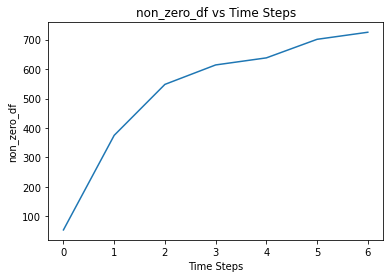

Enter a value: 4
     Boston_Arrowroot  Boston_Banana  Boston_Bran  Boston_Carrot  \
row                                                                
0               744.0          587.0        830.0          678.0   
1               773.0          611.0        986.0          702.0   
2               802.0          635.0       1142.0          725.0   
3               830.0          659.0       1298.0          748.0   
4               859.0          683.0       1454.0          771.0   
5               887.0          707.0       1610.0          794.0   
6               916.0          731.0       1766.0          817.0   
7               944.0          755.0       1922.0          840.0   
8               973.0          779.0       2078.0          863.0   
9              1001.0          803.0       2234.0          886.0   
10             1030.0          827.0       2390.0          909.0   
11             1058.0          851.0       2546.0          933.0   
12             1087.0          

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


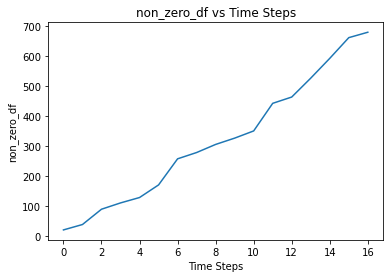

Enter a value: 12
     Boston_Arrowroot  Boston_Banana  Boston_Bran  Boston_Carrot  \
row                                                                
0               744.0          587.0        830.0          678.0   
1               773.0          611.0        986.0          702.0   
2               802.0          635.0       1142.0          725.0   
3               830.0          659.0       1298.0          748.0   
4               859.0          683.0       1454.0          771.0   
5               887.0          707.0       1610.0          794.0   
6               916.0          731.0       1766.0          817.0   
7               944.0          755.0       1922.0          840.0   
8               973.0          779.0       2078.0          863.0   
9              1001.0          803.0       2234.0          886.0   
10             1030.0          827.0       2390.0          909.0   
11             1058.0          851.0       2546.0          933.0   
12             1087.0         

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


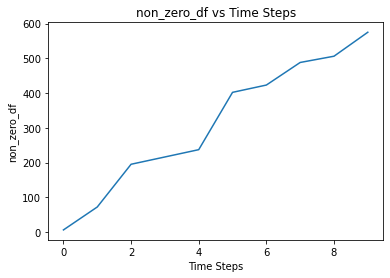

Enter a value: 8


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


     Boston_Arrowroot  Boston_Banana  Boston_Bran  Boston_Carrot  \
row                                                                
0               744.0          587.0        830.0          678.0   
1               773.0          611.0        986.0          702.0   
2               802.0          635.0       1142.0          725.0   
3               830.0          659.0       1298.0          748.0   
4               859.0          683.0       1454.0          771.0   
5               887.0          707.0       1610.0          794.0   
6               916.0          731.0       1766.0          817.0   
7               944.0          755.0       1922.0          840.0   
8               973.0          779.0       2078.0          863.0   
9              1001.0          803.0       2234.0          886.0   
10             1030.0          827.0       2390.0          909.0   
11             1058.0          851.0       2546.0          933.0   
12             1087.0          875.0       2702.

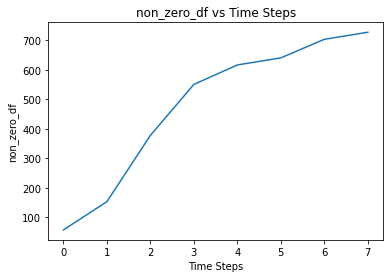

Enter a value: 6
     Boston_Arrowroot  Boston_Banana  Boston_Bran  Boston_Carrot  \
row                                                                
0               744.0          587.0        830.0          678.0   
1               773.0          611.0        986.0          702.0   
2               802.0          635.0       1142.0          725.0   
3               830.0          659.0       1298.0          748.0   
4               859.0          683.0       1454.0          771.0   
5               887.0          707.0       1610.0          794.0   
6               916.0          731.0       1766.0          817.0   
7               944.0          755.0       1922.0          840.0   
8               973.0          779.0       2078.0          863.0   
9              1001.0          803.0       2234.0          886.0   
10             1030.0          827.0       2390.0          909.0   
11             1058.0          851.0       2546.0          933.0   
12             1087.0          

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


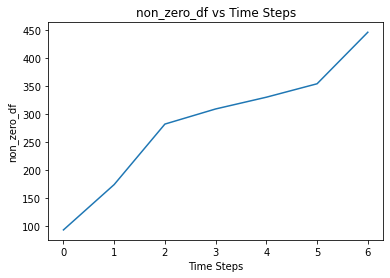

Enter a value: 5
     Boston_Arrowroot  Boston_Banana  Boston_Bran  Boston_Carrot  \
row                                                                
0               744.0          587.0        830.0          678.0   
1               773.0          611.0        986.0          702.0   
2               802.0          635.0       1142.0          725.0   
3               830.0          659.0       1298.0          748.0   
4               859.0          683.0       1454.0          771.0   
5               887.0          707.0       1610.0          794.0   
6               916.0          731.0       1766.0          817.0   
7               944.0          755.0       1922.0          840.0   
8               973.0          779.0       2078.0          863.0   
9              1001.0          803.0       2234.0          886.0   
10             1030.0          827.0       2390.0          909.0   
11             1058.0          851.0       2546.0          933.0   
12             1087.0          

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


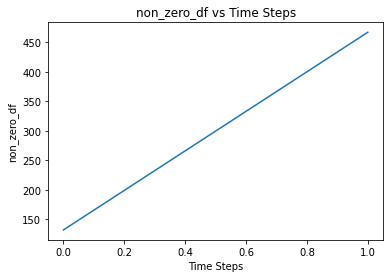

Enter a value: 0
     Boston_Arrowroot  Boston_Banana  Boston_Bran  Boston_Carrot  \
row                                                                
0               744.0          587.0        830.0          678.0   
1               773.0          611.0        986.0          702.0   
2               802.0          635.0       1142.0          725.0   
3               830.0          659.0       1298.0          748.0   
4               859.0          683.0       1454.0          771.0   
5               887.0          707.0       1610.0          794.0   
6               916.0          731.0       1766.0          817.0   
7               944.0          755.0       1922.0          840.0   
8               973.0          779.0       2078.0          863.0   
9              1001.0          803.0       2234.0          886.0   
10             1030.0          827.0       2390.0          909.0   
11             1058.0          851.0       2546.0          933.0   
12             1087.0          

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


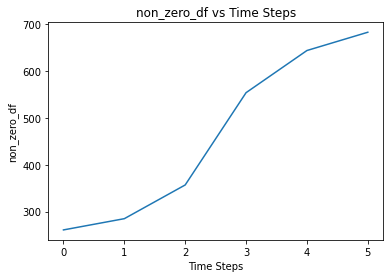

Enter a value: 4
     Boston_Arrowroot  Boston_Banana  Boston_Bran  Boston_Carrot  \
row                                                                
0               744.0          587.0        830.0          678.0   
1               773.0          611.0        986.0          702.0   
2               802.0          635.0       1142.0          725.0   
3               830.0          659.0       1298.0          748.0   
4               859.0          683.0       1454.0          771.0   
5               887.0          707.0       1610.0          794.0   
6               916.0          731.0       1766.0          817.0   
7               944.0          755.0       1922.0          840.0   
8               973.0          779.0       2078.0          863.0   
9              1001.0          803.0       2234.0          886.0   
10             1030.0          827.0       2390.0          909.0   
11             1058.0          851.0       2546.0          933.0   
12             1087.0          

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


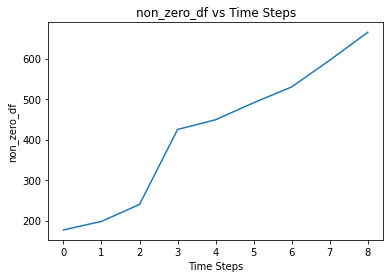

Enter a value: 3


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


     Boston_Arrowroot  Boston_Banana  Boston_Bran  Boston_Carrot  \
row                                                                
0               744.0          587.0        830.0          678.0   
1               773.0          611.0        986.0          702.0   
2               802.0          635.0       1142.0          725.0   
3               830.0          659.0       1298.0          748.0   
4               859.0          683.0       1454.0          771.0   
5               887.0          707.0       1610.0          794.0   
6               916.0          731.0       1766.0          817.0   
7               944.0          755.0       1922.0          840.0   
8               973.0          779.0       2078.0          863.0   
9              1001.0          803.0       2234.0          886.0   
10             1030.0          827.0       2390.0          909.0   
11             1058.0          851.0       2546.0          933.0   
12             1087.0          875.0       2702.

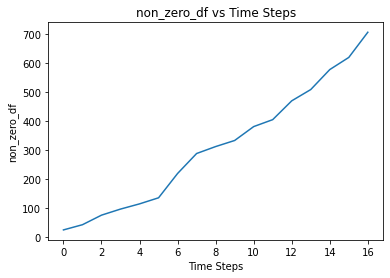

Enter a value: 7


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


     Boston_Arrowroot  Boston_Banana  Boston_Bran  Boston_Carrot  \
row                                                                
0               744.0          587.0        830.0          678.0   
1               773.0          611.0        986.0          702.0   
2               802.0          635.0       1142.0          725.0   
3               830.0          659.0       1298.0          748.0   
4               859.0          683.0       1454.0          771.0   
5               887.0          707.0       1610.0          794.0   
6               916.0          731.0       1766.0          817.0   
7               944.0          755.0       1922.0          840.0   
8               973.0          779.0       2078.0          863.0   
9              1001.0          803.0       2234.0          886.0   
10             1030.0          827.0       2390.0          909.0   
11             1058.0          851.0       2546.0          933.0   
12             1087.0          875.0       2702.

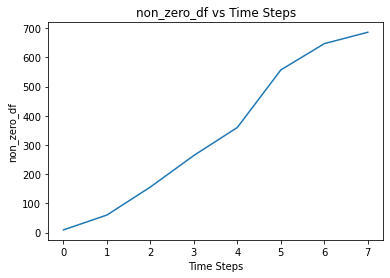

Enter a value: 6
     Boston_Arrowroot  Boston_Banana  Boston_Bran  Boston_Carrot  \
row                                                                
0               744.0          587.0        830.0          678.0   
1               773.0          611.0        986.0          702.0   
2               802.0          635.0       1142.0          725.0   
3               830.0          659.0       1298.0          748.0   
4               859.0          683.0       1454.0          771.0   
5               887.0          707.0       1610.0          794.0   
6               916.0          731.0       1766.0          817.0   
7               944.0          755.0       1922.0          840.0   
8               973.0          779.0       2078.0          863.0   
9              1001.0          803.0       2234.0          886.0   
10             1030.0          827.0       2390.0          909.0   
11             1058.0          851.0       2546.0          933.0   
12             1087.0          

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


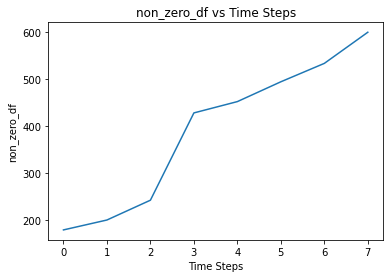

Enter a value: 4
     Boston_Arrowroot  Boston_Banana  Boston_Bran  Boston_Carrot  \
row                                                                
0               744.0          587.0        830.0          678.0   
1               773.0          611.0        986.0          702.0   
2               802.0          635.0       1142.0          725.0   
3               830.0          659.0       1298.0          748.0   
4               859.0          683.0       1454.0          771.0   
5               887.0          707.0       1610.0          794.0   
6               916.0          731.0       1766.0          817.0   
7               944.0          755.0       1922.0          840.0   
8               973.0          779.0       2078.0          863.0   
9              1001.0          803.0       2234.0          886.0   
10             1030.0          827.0       2390.0          909.0   
11             1058.0          851.0       2546.0          933.0   
12             1087.0          

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


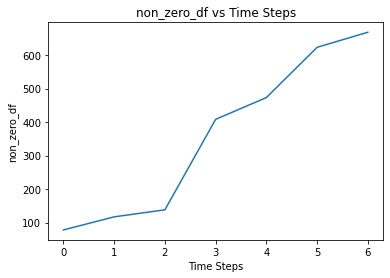

Enter a value: 5
     Boston_Arrowroot  Boston_Banana  Boston_Bran  Boston_Carrot  \
row                                                                
0               744.0          587.0        830.0          678.0   
1               773.0          611.0        986.0          702.0   
2               802.0          635.0       1142.0          725.0   
3               830.0          659.0       1298.0          748.0   
4               859.0          683.0       1454.0          771.0   
5               887.0          707.0       1610.0          794.0   
6               916.0          731.0       1766.0          817.0   
7               944.0          755.0       1922.0          840.0   
8               973.0          779.0       2078.0          863.0   
9              1001.0          803.0       2234.0          886.0   
10             1030.0          827.0       2390.0          909.0   
11             1058.0          851.0       2546.0          933.0   
12             1087.0          

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


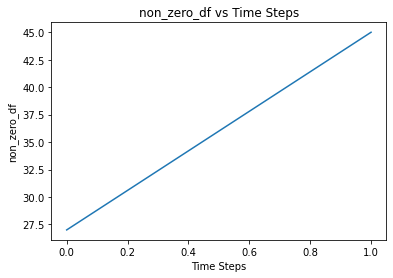

Enter a value: 0
     Boston_Arrowroot  Boston_Banana  Boston_Bran  Boston_Carrot  \
row                                                                
0               744.0          587.0        830.0          678.0   
1               773.0          611.0        986.0          702.0   
2               802.0          635.0       1142.0          725.0   
3               830.0          659.0       1298.0          748.0   
4               859.0          683.0       1454.0          771.0   
5               887.0          707.0       1610.0          794.0   
6               916.0          731.0       1766.0          817.0   
7               944.0          755.0       1922.0          840.0   
8               973.0          779.0       2078.0          863.0   
9              1001.0          803.0       2234.0          886.0   
10             1030.0          827.0       2390.0          909.0   
11             1058.0          851.0       2546.0          933.0   
12             1087.0          

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


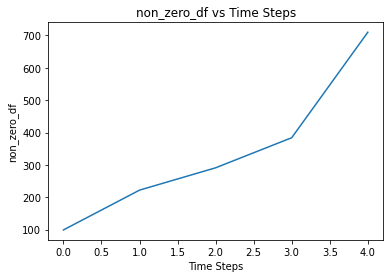

Enter a value: 3


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


     Boston_Arrowroot  Boston_Banana  Boston_Bran  Boston_Carrot  \
row                                                                
0               744.0          587.0        830.0          678.0   
1               773.0          611.0        986.0          702.0   
2               802.0          635.0       1142.0          725.0   
3               830.0          659.0       1298.0          748.0   
4               859.0          683.0       1454.0          771.0   
5               887.0          707.0       1610.0          794.0   
6               916.0          731.0       1766.0          817.0   
7               944.0          755.0       1922.0          840.0   
8               973.0          779.0       2078.0          863.0   
9              1001.0          803.0       2234.0          886.0   
10             1030.0          827.0       2390.0          909.0   
11             1058.0          851.0       2546.0          933.0   
12             1087.0          875.0       2702.

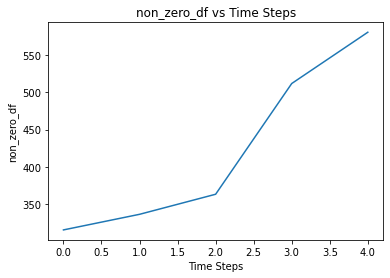

Enter a value: 3


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


     Boston_Arrowroot  Boston_Banana  Boston_Bran  Boston_Carrot  \
row                                                                
0               744.0          587.0        830.0          678.0   
1               773.0          611.0        986.0          702.0   
2               802.0          635.0       1142.0          725.0   
3               830.0          659.0       1298.0          748.0   
4               859.0          683.0       1454.0          771.0   
5               887.0          707.0       1610.0          794.0   
6               916.0          731.0       1766.0          817.0   
7               944.0          755.0       1922.0          840.0   
8               973.0          779.0       2078.0          863.0   
9              1001.0          803.0       2234.0          886.0   
10             1030.0          827.0       2390.0          909.0   
11             1058.0          851.0       2546.0          933.0   
12             1087.0          875.0       2702.

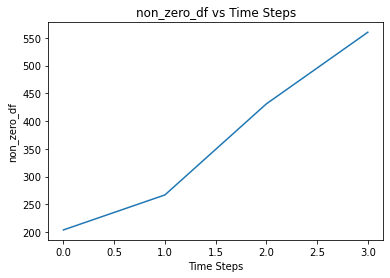

Enter a value: 1


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


     Boston_Arrowroot  Boston_Banana  Boston_Bran  Boston_Carrot  \
row                                                                
0               744.0          587.0        830.0          678.0   
1               773.0          611.0        986.0          702.0   
2               802.0          635.0       1142.0          725.0   
3               830.0          659.0       1298.0          748.0   
4               859.0          683.0       1454.0          771.0   
5               887.0          707.0       1610.0          794.0   
6               916.0          731.0       1766.0          817.0   
7               944.0          755.0       1922.0          840.0   
8               973.0          779.0       2078.0          863.0   
9              1001.0          803.0       2234.0          886.0   
10             1030.0          827.0       2390.0          909.0   
11             1058.0          851.0       2546.0          933.0   
12             1087.0          875.0       2702.

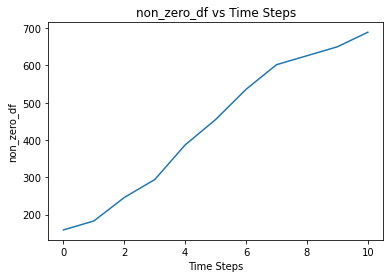

Enter a value: 7


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


     Boston_Arrowroot  Boston_Banana  Boston_Bran  Boston_Carrot  \
row                                                                
0               744.0          587.0        830.0          678.0   
1               773.0          611.0        986.0          702.0   
2               802.0          635.0       1142.0          725.0   
3               830.0          659.0       1298.0          748.0   
4               859.0          683.0       1454.0          771.0   
5               887.0          707.0       1610.0          794.0   
6               916.0          731.0       1766.0          817.0   
7               944.0          755.0       1922.0          840.0   
8               973.0          779.0       2078.0          863.0   
9              1001.0          803.0       2234.0          886.0   
10             1030.0          827.0       2390.0          909.0   
11             1058.0          851.0       2546.0          933.0   
12             1087.0          875.0       2702.

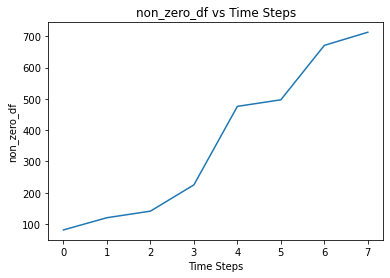

Enter a value: 6


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


     Boston_Arrowroot  Boston_Banana  Boston_Bran  Boston_Carrot  \
row                                                                
0               744.0          587.0        830.0          678.0   
1               773.0          611.0        986.0          702.0   
2               802.0          635.0       1142.0          725.0   
3               830.0          659.0       1298.0          748.0   
4               859.0          683.0       1454.0          771.0   
5               887.0          707.0       1610.0          794.0   
6               916.0          731.0       1766.0          817.0   
7               944.0          755.0       1922.0          840.0   
8               973.0          779.0       2078.0          863.0   
9              1001.0          803.0       2234.0          886.0   
10             1030.0          827.0       2390.0          909.0   
11             1058.0          851.0       2546.0          933.0   
12             1087.0          875.0       2702.

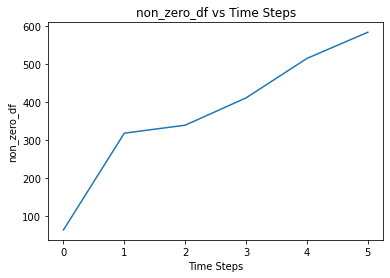

Enter a value: 2


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


     Boston_Arrowroot  Boston_Banana  Boston_Bran  Boston_Carrot  \
row                                                                
0               744.0          587.0        830.0          678.0   
1               773.0          611.0        986.0          702.0   
2               802.0          635.0       1142.0          725.0   
3               830.0          659.0       1298.0          748.0   
4               859.0          683.0       1454.0          771.0   
5               887.0          707.0       1610.0          794.0   
6               916.0          731.0       1766.0          817.0   
7               944.0          755.0       1922.0          840.0   
8               973.0          779.0       2078.0          863.0   
9              1001.0          803.0       2234.0          886.0   
10             1030.0          827.0       2390.0          909.0   
11             1058.0          851.0       2546.0          933.0   
12             1087.0          875.0       2702.

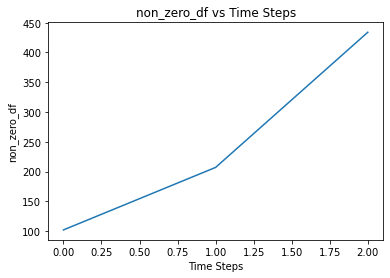

Enter a value: 1
     Boston_Arrowroot  Boston_Banana  Boston_Bran  Boston_Carrot  \
row                                                                
0               744.0          587.0        830.0          678.0   
1               773.0          611.0        986.0          702.0   
2               802.0          635.0       1142.0          725.0   
3               830.0          659.0       1298.0          748.0   
4               859.0          683.0       1454.0          771.0   
5               887.0          707.0       1610.0          794.0   
6               916.0          731.0       1766.0          817.0   
7               944.0          755.0       1922.0          840.0   
8               973.0          779.0       2078.0          863.0   
9              1001.0          803.0       2234.0          886.0   
10             1030.0          827.0       2390.0          909.0   
11             1058.0          851.0       2546.0          933.0   
12             1087.0          

/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


In [286]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.deterministic import DeterministicProcess
import numpy as np
from sklearn.linear_model import LinearRegression
df = df_occurence
import ruptures as rpt


#creating a 30 row and 31 column df
# Create the row and column labels
rows = pd.Index(range(30), name='row')
cols = df_occurence.columns

# Create the empty DataFrame with the desired shape and column names
df_instnc_fore = pd.DataFrame(columns=cols, index=rows)


df.head()

    # Assuming your DataFrame is named 'df'
i=0
for column in df.columns:
    # Create a new DataFrame with only non-zero values
    non_zero_df = df[df[column] != 0][[column]]
    # calculate the time steps
    n = len(non_zero_df)
    time_steps = np.arange(n)
   # plot the time series data against the time steps
    plt.plot(time_steps, non_zero_df[column])
    plt.xlabel('Time Steps')
    plt.ylabel('non_zero_df')
    plt.title('non_zero_df vs Time Steps')
    plt.show()
    value = int(input("Enter a value: "))
    
    non_zero_df=non_zero_df.iloc[value:]
    
#   non_zero_df['Timestep'] = np.arange(len(non_zero_df.index))
    dp = DeterministicProcess(
    index=non_zero_df.index,  # dates from the training data
    constant=True,       # dummy feature for the bias (y_intercept)
    order=1,             # the time dummy (trend)
    drop=True, )        # drop terms if necessary to avoid collinearity

# `in_sample` creates features for the dates given in the `index` argument
    Xin = dp.in_sample()
    y = non_zero_df[column]
    #X=pd.DataFrame(non_zero_df['Timestep'])
    model = LinearRegression(fit_intercept=False)
    model.fit(Xin, y)
    #X_fore = dp.out_of_sample(steps=30)
    X = dp.out_of_sample(steps=30)
    y_fore = pd.Series(model.predict(X), index=X.index)
    y_fore=round(y_fore)
    y_fore=y_fore.reset_index()
    y_fore = y_fore.rename(columns={'index': 'trend'})
    y_fore = y_fore.rename(columns={y_fore.columns[1]: 'pred'})
    

   
    #print(df_instnc_fore)
    #column=0
    df_instnc_fore[column]=y_fore['pred']
   # print(df_instnc_fore)
    
    #print(Xin)
    i=i+1
    if i>29:
        break
#.   df_instnc_fore        
    # Fit an ARIMA model on the non-zero DataFrame
#    model = ARIMA(non_zero_df[column], order=(1, 1, 1))  # assuming ARIMA(1,1,1) model
 #   model_fit = model.fit()   
    # Forecast the next 6 months of values
  #  forecast = model_fit.forecast(steps=180)
    
   #  Plot the original and forecasted data
  #  plt.plot(Xin.trend, y, label='Original')
   # plt.plot(y_fore.trend, y_fore.pred, label='Forecast')
    #plt.title(f' Forecast for {column}')
   # plt.xlabel('Time')
   # plt.ylabel('Value')
   # plt.legend()
   # plt.show()

In [287]:
df_instnc_fore

,Boston_Arrowroot,Boston_Banana,Boston_Bran,Boston_Carrot,Boston_Chocolate Chip,Boston_Oatmeal Raisin,Boston_Potato_chips_h,Boston_Pretzels,Boston_Whole Wheat,Los Angeles_Arrowroot,...,New York_Potato_chips_h,New York_Potato_chips_l,New York_Whole Wheat,San Diego_Arrowroot,San Diego_Bran,San Diego_Carrot,San Diego_Chocolate Chip,San Diego_Oatmeal Raisin,San Diego_Potato_chips_h,San Diego_Whole Wheat
row,,,,,,,,,,,,,,,,,,,,,
0,744.0,587.0,830.0,678.0,743.0,833.0,484.0,657.0,756.0,644.0,...,713.0,63.0,1036.0,650.0,712.0,713.0,755.0,672.0,661.0,NaN
1,773.0,611.0,986.0,702.0,767.0,989.0,528.0,680.0,788.0,720.0,...,758.0,81.0,1362.0,719.0,859.0,742.0,797.0,756.0,888.0,NaN
2,802.0,635.0,1142.0,725.0,791.0,1145.0,572.0,702.0,819.0,796.0,...,803.0,99.0,1688.0,788.0,1005.0,770.0,839.0,840.0,1115.0,NaN
3,830.0,659.0,1298.0,748.0,815.0,1301.0,616.0,725.0,851.0,872.0,...,848.0,117.0,2014.0,857.0,1152.0,798.0,881.0,924.0,1342.0,NaN
4,859.0,683.0,1454.0,771.0,839.0,1457.0,660.0,747.0,882.0,948.0,...,893.0,135.0,2340.0,926.0,1298.0,827.0,923.0,1008.0,1569.0,NaN
5,887.0,707.0,1610.0,794.0,863.0,1613.0,704.0,770.0,914.0,1024.0,...,938.0,153.0,2666.0,995.0,1445.0,855.0,965.0,1091.0,1796.0,NaN
6,916.0,731.0,1766.0,817.0,887.0,1769.0,748.0,792.0,945.0,1100.0,...,983.0,171.0,2992.0,1064.0,1591.0,884.0,1007.0,1175.0,2023.0,NaN
7,944.0,755.0,1922.0,840.0,911.0,1925.0,792.0,814.0,977.0,1176.0,...,1028.0,189.0,3318.0,1133.0,1738.0,912.0,1049.0,1259.0,2250.0,NaN
8,973.0,779.0,2078.0,863.0,935.0,2081.0,836.0,837.0,1008.0,1252.0,...,1073.0,207.0,3644.0,1202.0,1884.0,941.0,1091.0,1343.0,2477.0,NaN


In [ ]:
#Now we are good with the occurence table
#Next task is to ensure that we find the way to extrapolate the actual quantity values across the 31 classes

In [288]:
df_31_730
#We will have to add the rows which are missing and have null values. For this we will have to use 

city_product,Boston_Arrowroot,Boston_Banana,Boston_Bran,Boston_Carrot,Boston_Chocolate Chip,Boston_Oatmeal Raisin,Boston_Potato_chips_h,Boston_Pretzels,Boston_Whole Wheat,Los Angeles_Arrowroot,...,New York_Potato_chips_h,New York_Potato_chips_l,New York_Whole Wheat,San Diego_Arrowroot,San Diego_Bran,San Diego_Carrot,San Diego_Chocolate Chip,San Diego_Oatmeal Raisin,San Diego_Potato_chips_h,San Diego_Whole Wheat
Date,,,,,,,,,,,,,,,,,,,,,
2022-01-01,0.0,0.0,0.0,33.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,87.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-13,38.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-18,34.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-12-21,0.0,0.0,0.0,0.0,245.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2023-12-24,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,30.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [301]:
#sorry, i already have the required table
merged_df=result_df

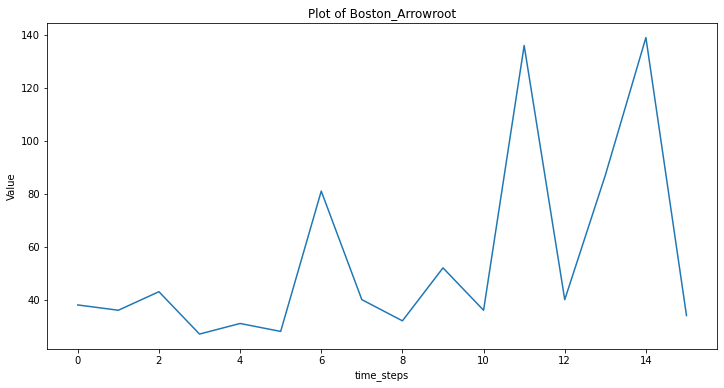

Enter a value: 10


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


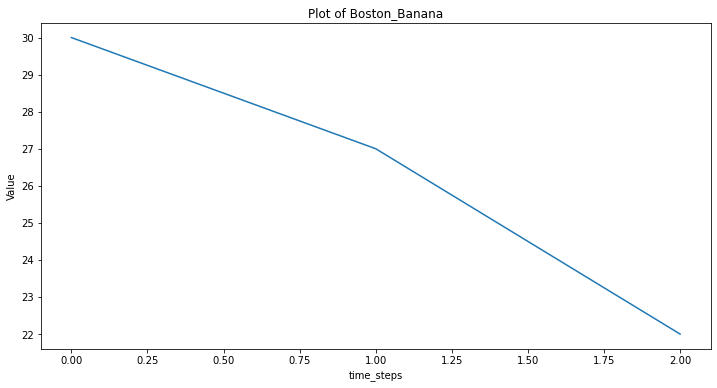

Enter a value: 1


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


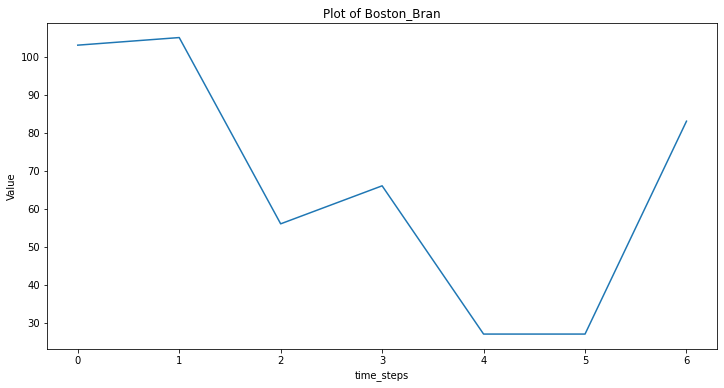

Enter a value: 5


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


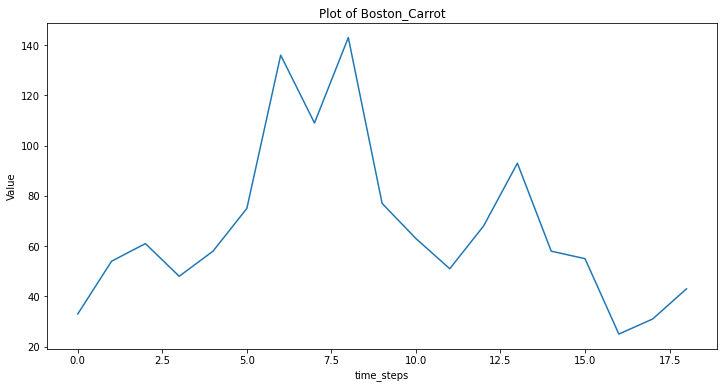

Enter a value: 16


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


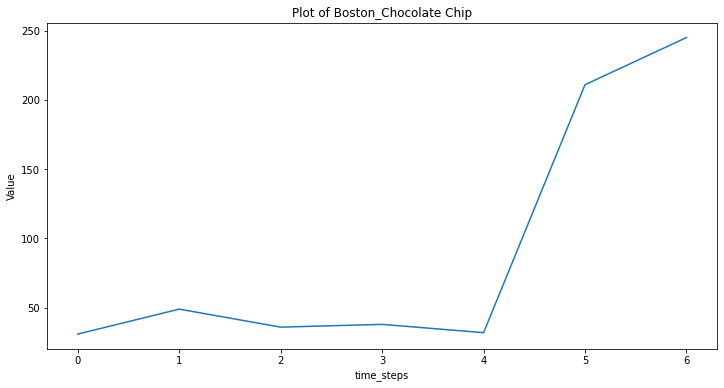

Enter a value: 4


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


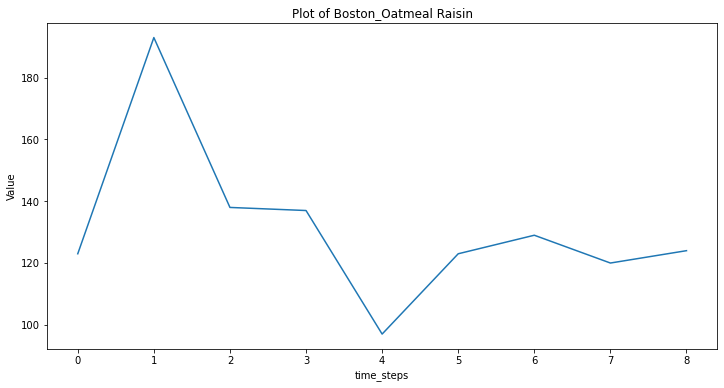

Enter a value: 7


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


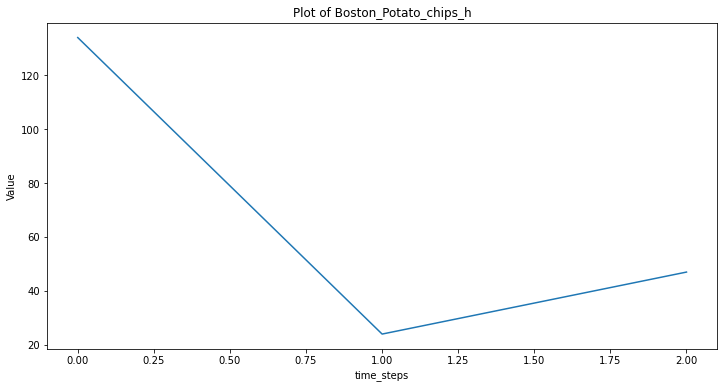

Enter a value: 1


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


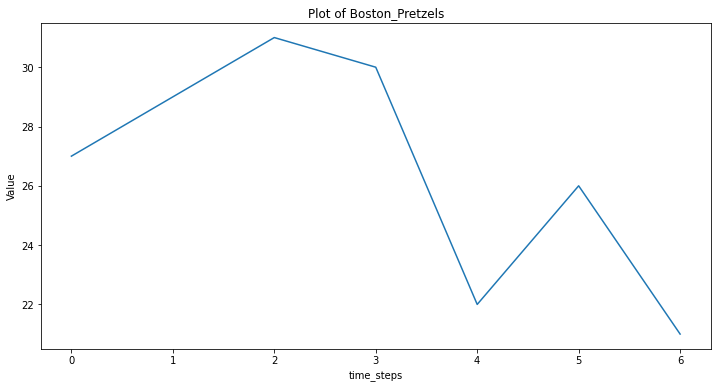

Enter a value: 3


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


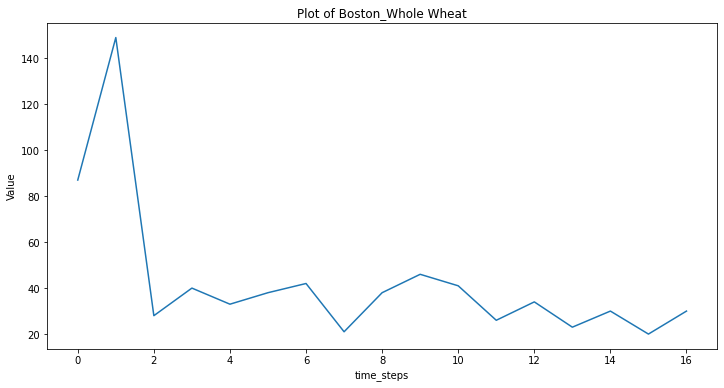

Enter a value: 13


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


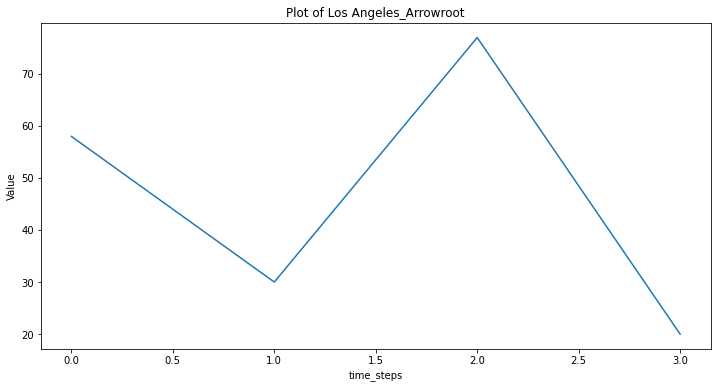

Enter a value: 1


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


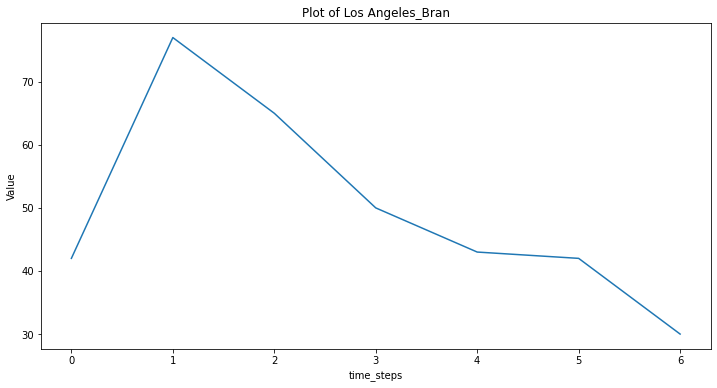

Enter a value: 3


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


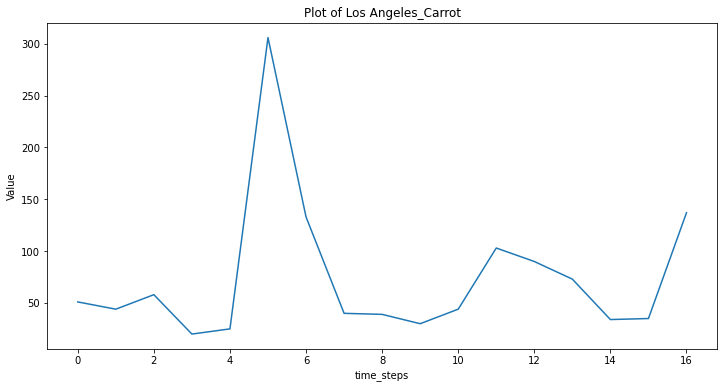

Enter a value: 14


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


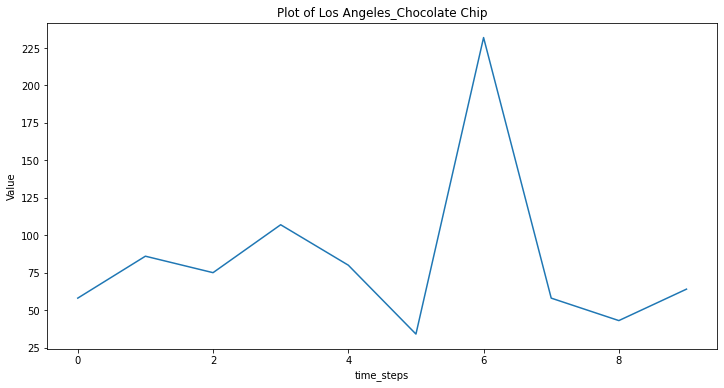

Enter a value: 7


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


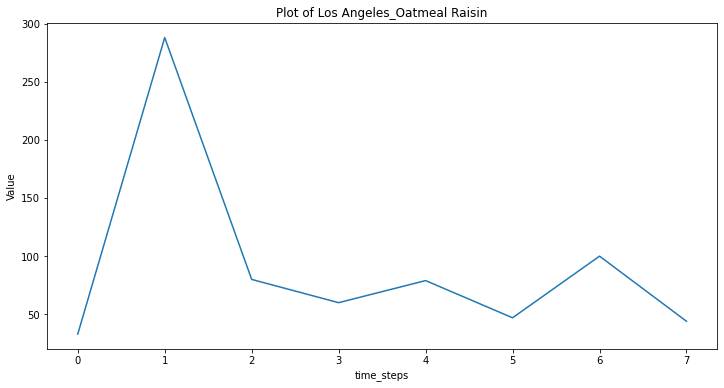

Enter a value: 4


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


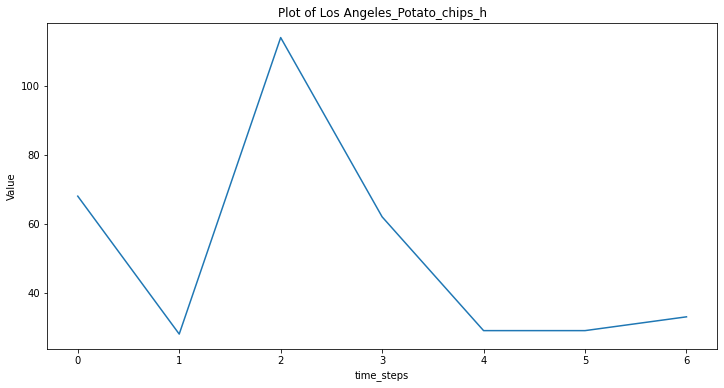

Enter a value: 3


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


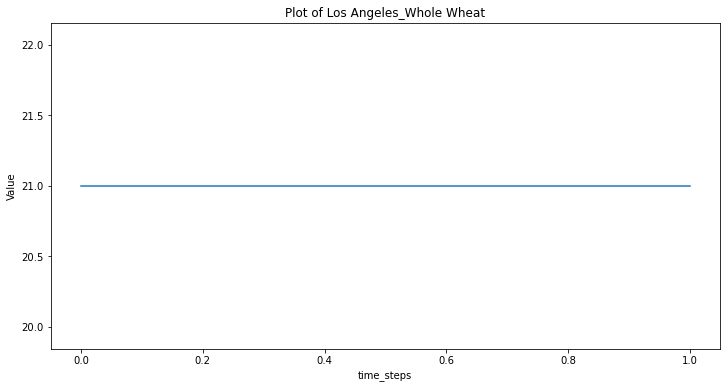

Enter a value: 0


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


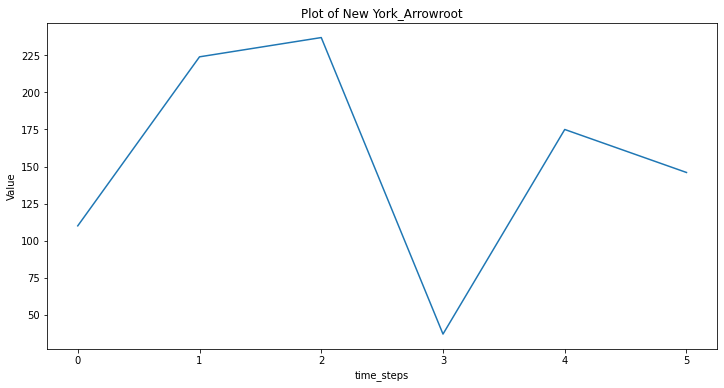

Enter a value: 3


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


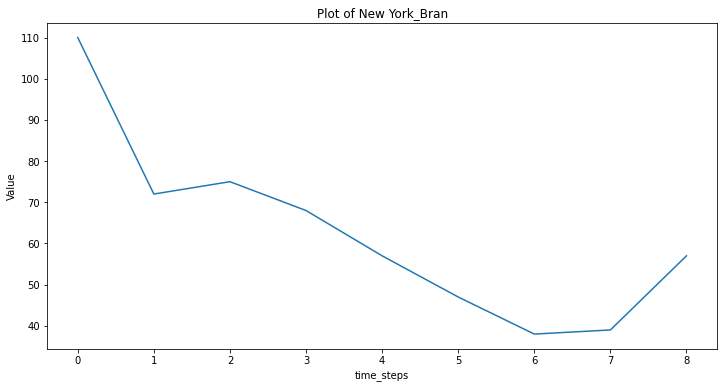

Enter a value: 6


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


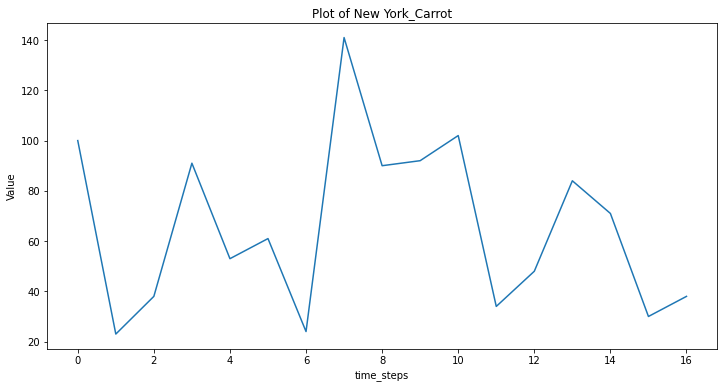

Enter a value: 14


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


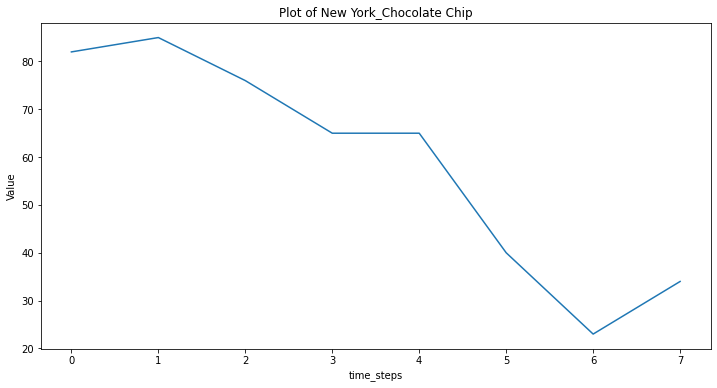

Enter a value: 6


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


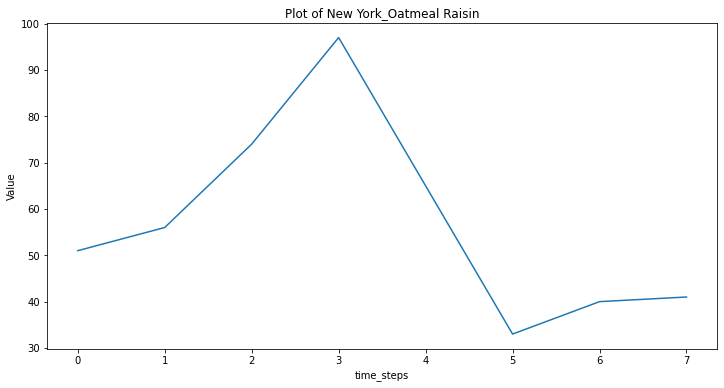

Enter a value: 5


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


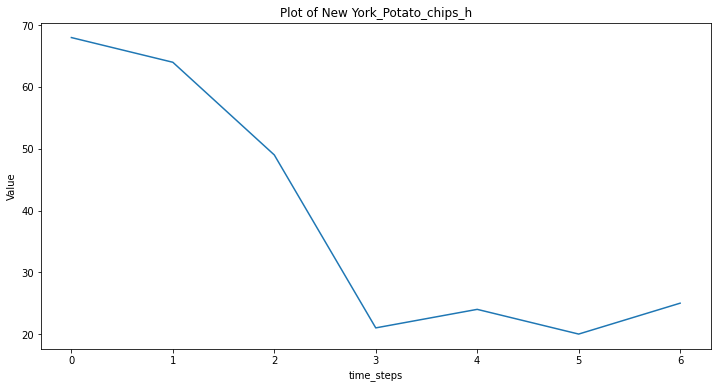

Enter a value: 5


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


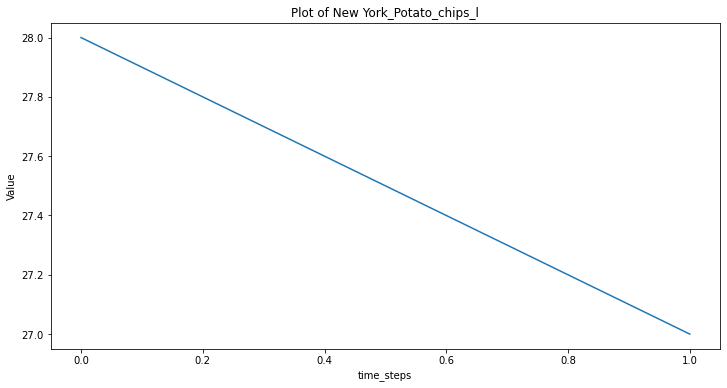

Enter a value: 0


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


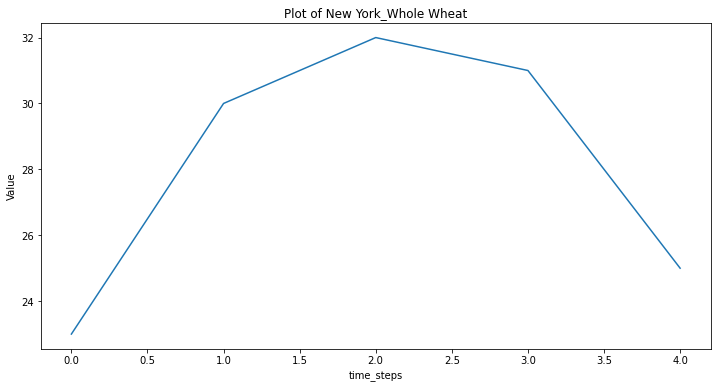

Enter a value: 2


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


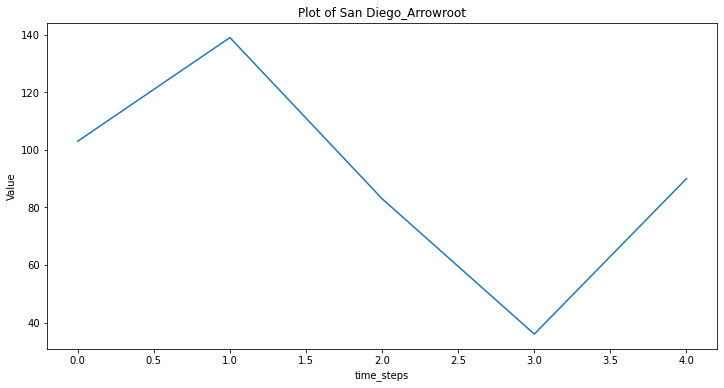

Enter a value: 3


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


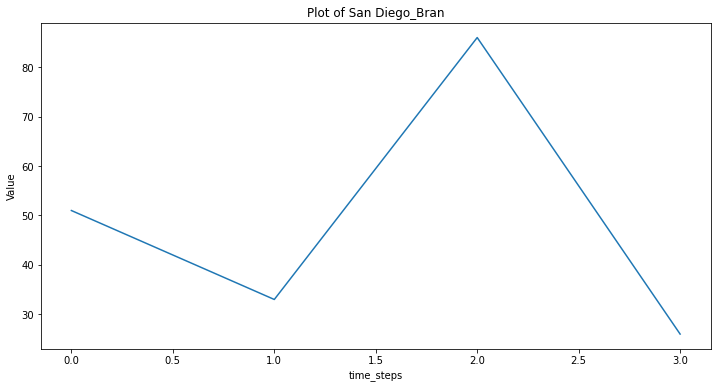

Enter a value: 2


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


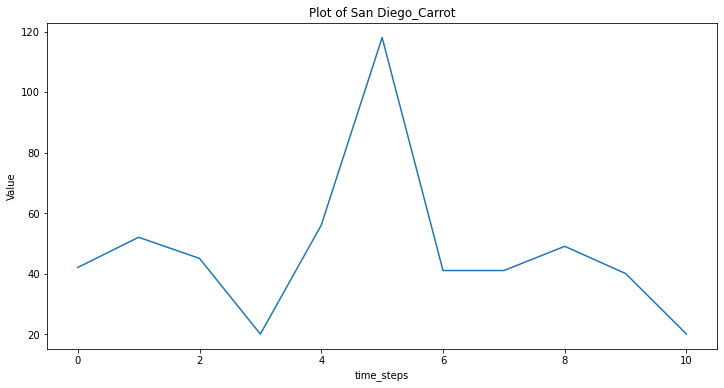

Enter a value: 6


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


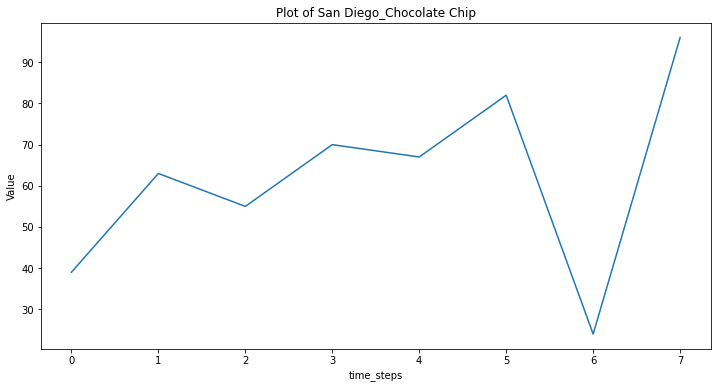

Enter a value: 6


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


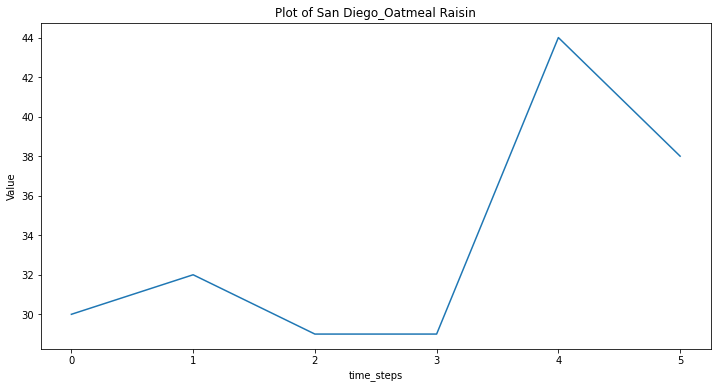

Enter a value: 3


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


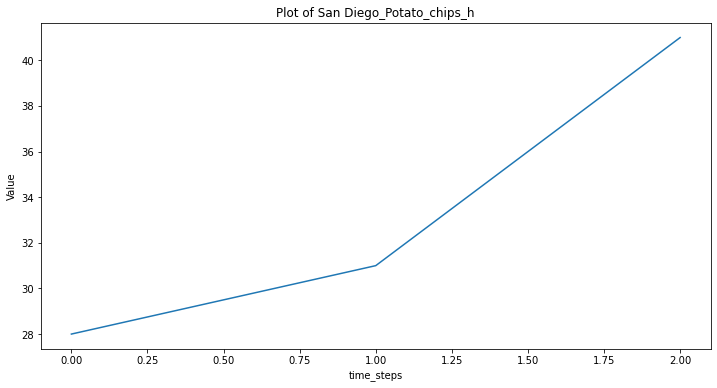

Enter a value: 1


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


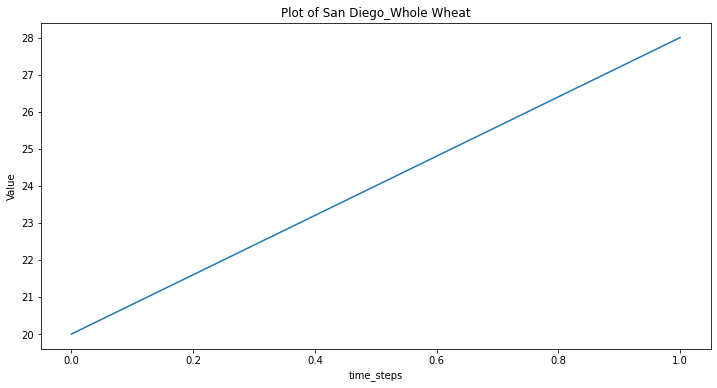

Enter a value: 0


/opt/anaconda3/lib/python3.8/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


In [327]:

import matplotlib.pyplot as plt
from statsmodels.tsa.deterministic import DeterministicProcess
i=0
# Create the row and column labels
rows = pd.Index(range(30), name='row')
cols = df_occurence.columns
# Create the empty DataFrame with the desired shape and column names
df_qty_fore = pd.DataFrame(columns=cols, index=rows)
# loop over each column and create a plot

for col in merged_df.columns:
    filtered_df = result[result[col] != 0]
    #   non_zero_df['Timestep'] = np.arange(len(non_zero_df.index))
    n = len(filtered_df.index)
    time_steps = np.arange(n)
    
    
    fig, ax = plt.subplots(figsize=(12, 6))
    ax.plot(time_steps, filtered_df[col])
    ax.set(title=f'Plot of {col}', xlabel='time_steps', ylabel='Value')
    plt.show()
    value = int(input("Enter a value: "))
    
    filtered_df=filtered_df.iloc[value:]
    dp = DeterministicProcess(
    index=filtered_df.index,  # dates from the training data
    constant=True,       # dummy feature for the bias (y_intercept)
    order=1,             # the time dummy (trend)
    drop=True, )        # drop terms if necessary to avoid collinearity
# `in_sample` creates features for the dates given in the `index` argument
    Xin = dp.in_sample()
    y = filtered_df[col]
    #X=pd.DataFrame(non_zero_df['Timestep'])
    model = LinearRegression(fit_intercept=False)
    model.fit(Xin, y)
    #X_fore = dp.out_of_sample(steps=30)
    X = dp.out_of_sample(steps=30)
    y_fore = pd.Series(model.predict(X), index=X.index)
    y_fore=round(y_fore)
    y_fore=y_fore.reset_index()
    y_fore = y_fore.rename(columns={'index': 'trend'})
    y_fore = y_fore.rename(columns={y_fore.columns[1]: 'pred'})
    df_qty_fore[col]=y_fore['pred']
    #print(df_qty_fore)
    #i=i+1
    #if i>0:
    #    break
    #y_fore=y_fore.reset_index()
    #y_fore = y_fore.rename(columns={'index': 'trend'})
    #y_fore = y_fore.rename(columns={y_fore.columns[1]: 'pred'})    

In [328]:
df_qty_fore

,Boston_Arrowroot,Boston_Banana,Boston_Bran,Boston_Carrot,Boston_Chocolate Chip,Boston_Oatmeal Raisin,Boston_Potato_chips_h,Boston_Pretzels,Boston_Whole Wheat,Los Angeles_Arrowroot,...,New York_Potato_chips_h,New York_Potato_chips_l,New York_Whole Wheat,San Diego_Arrowroot,San Diego_Bran,San Diego_Carrot,San Diego_Chocolate Chip,San Diego_Oatmeal Raisin,San Diego_Potato_chips_h,San Diego_Whole Wheat
row,,,,,,,,,,,,,,,,,,,,,
0,83.0,17.0,139.0,51.0,376.0,128.0,70.0,19.0,29.0,32.0,...,30.0,26.0,22.0,144.0,-34.0,25.0,168.0,46.0,51.0,36.0
1,85.0,12.0,195.0,60.0,482.0,132.0,93.0,17.0,30.0,27.0,...,35.0,25.0,19.0,198.0,-94.0,21.0,240.0,51.0,61.0,44.0
2,86.0,7.0,251.0,69.0,589.0,136.0,116.0,14.0,31.0,22.0,...,40.0,24.0,15.0,252.0,-154.0,17.0,312.0,55.0,71.0,52.0
3,87.0,2.0,307.0,78.0,695.0,140.0,139.0,12.0,32.0,17.0,...,45.0,23.0,12.0,306.0,-214.0,12.0,384.0,60.0,81.0,60.0
4,89.0,-3.0,363.0,87.0,802.0,144.0,162.0,10.0,33.0,12.0,...,50.0,22.0,8.0,360.0,-274.0,8.0,456.0,64.0,91.0,68.0
5,90.0,-8.0,419.0,96.0,908.0,148.0,185.0,8.0,34.0,7.0,...,55.0,21.0,5.0,414.0,-334.0,4.0,528.0,69.0,101.0,76.0
6,91.0,-13.0,475.0,105.0,1015.0,152.0,208.0,5.0,35.0,2.0,...,60.0,20.0,1.0,468.0,-394.0,-1.0,600.0,73.0,111.0,84.0
7,92.0,-18.0,531.0,114.0,1121.0,156.0,231.0,3.0,36.0,-3.0,...,65.0,19.0,-2.0,522.0,-454.0,-5.0,672.0,78.0,121.0,92.0
8,94.0,-23.0,587.0,123.0,1228.0,160.0,254.0,1.0,37.0,-8.0,...,70.0,18.0,-6.0,576.0,-514.0,-9.0,744.0,82.0,131.0,100.0


In [330]:
#So now we have 2 dfs - df_instnc_fore and df_ty_fore
#What we do now is make a new df with new foecasted values from Jan-1-24 till june 30th 2024
#Rules while looping - 1. Date has to be the index

In [351]:
#df_instnc_fore
df_qty_fore

,Boston_Arrowroot,Boston_Banana,Boston_Bran,Boston_Carrot,Boston_Chocolate Chip,Boston_Oatmeal Raisin,Boston_Potato_chips_h,Boston_Pretzels,Boston_Whole Wheat,Los Angeles_Arrowroot,...,New York_Potato_chips_h,New York_Potato_chips_l,New York_Whole Wheat,San Diego_Arrowroot,San Diego_Bran,San Diego_Carrot,San Diego_Chocolate Chip,San Diego_Oatmeal Raisin,San Diego_Potato_chips_h,San Diego_Whole Wheat
row,,,,,,,,,,,,,,,,,,,,,
0,83.0,17.0,139.0,51.0,376.0,128.0,70.0,19.0,29.0,32.0,...,30.0,26.0,22.0,144.0,-34.0,25.0,168.0,46.0,51.0,36.0
1,85.0,12.0,195.0,60.0,482.0,132.0,93.0,17.0,30.0,27.0,...,35.0,25.0,19.0,198.0,-94.0,21.0,240.0,51.0,61.0,44.0
2,86.0,7.0,251.0,69.0,589.0,136.0,116.0,14.0,31.0,22.0,...,40.0,24.0,15.0,252.0,-154.0,17.0,312.0,55.0,71.0,52.0
3,87.0,2.0,307.0,78.0,695.0,140.0,139.0,12.0,32.0,17.0,...,45.0,23.0,12.0,306.0,-214.0,12.0,384.0,60.0,81.0,60.0
4,89.0,-3.0,363.0,87.0,802.0,144.0,162.0,10.0,33.0,12.0,...,50.0,22.0,8.0,360.0,-274.0,8.0,456.0,64.0,91.0,68.0
5,90.0,-8.0,419.0,96.0,908.0,148.0,185.0,8.0,34.0,7.0,...,55.0,21.0,5.0,414.0,-334.0,4.0,528.0,69.0,101.0,76.0
6,91.0,-13.0,475.0,105.0,1015.0,152.0,208.0,5.0,35.0,2.0,...,60.0,20.0,1.0,468.0,-394.0,-1.0,600.0,73.0,111.0,84.0
7,92.0,-18.0,531.0,114.0,1121.0,156.0,231.0,3.0,36.0,-3.0,...,65.0,19.0,-2.0,522.0,-454.0,-5.0,672.0,78.0,121.0,92.0
8,94.0,-23.0,587.0,123.0,1228.0,160.0,254.0,1.0,37.0,-8.0,...,70.0,18.0,-6.0,576.0,-514.0,-9.0,744.0,82.0,131.0,100.0


In [354]:

# Set the max_rows parameter to None to remove the display limitation
pd.options.display.max_rows = None



# Create an empty DataFrame to store the new values
new_df = pd.DataFrame(columns=df_instnc_fore.columns, index=range(3000))

j=0
for col in new_df.columns:
    for i in range(1, 10):
        idx=df_instnc_fore.at[i,col]
        qty=df_qty_fore.at[i,col]
        new_df.at[idx,col]=qty
        #print(new_df.at[idx,col])
        #print(idx)
        #print(col)
        #print(qty)
   # j=j+1    
   # if j>5:
        
   #     break
new_df        


# Loop through each column in df_instnc_fore and map the row indices to the values in df_qty_fore
#for col in df_instnc_fore.columns:
 #   for col in df_qty_fore.columns:
  #  new_col = []
   # for idx in df_instnc_fore.index:
    #    instnc = df_instnc_fore.at[idx, col]
     #   qty = df_qty_fore.at[instnc, col]
      #  new_col.append(qty)
    #new_df[col] = new_col

# Display the new DataFrame
#print(new_df)

,Boston_Arrowroot,Boston_Banana,Boston_Bran,Boston_Carrot,Boston_Chocolate Chip,Boston_Oatmeal Raisin,Boston_Potato_chips_h,Boston_Pretzels,Boston_Whole Wheat,Los Angeles_Arrowroot,...,New York_Potato_chips_h,New York_Potato_chips_l,New York_Whole Wheat,San Diego_Arrowroot,San Diego_Bran,San Diego_Carrot,San Diego_Chocolate Chip,San Diego_Oatmeal Raisin,San Diego_Potato_chips_h,San Diego_Whole Wheat
0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [355]:
# Define the start date
start_date = pd.to_datetime('2022-01-01')

# Create a date range starting from the start date with a frequency of 1 day
date_range = pd.date_range(start=start_date, periods=len(new_df), freq='D')

# Assign the date range as a new column in the new_df DataFrame
new_df['Date'] = date_range

In [360]:
new_df.set_index('Date')
new_df

,Boston_Arrowroot,Boston_Banana,Boston_Bran,Boston_Carrot,Boston_Chocolate Chip,Boston_Oatmeal Raisin,Boston_Potato_chips_h,Boston_Pretzels,Boston_Whole Wheat,Los Angeles_Arrowroot,...,New York_Potato_chips_l,New York_Whole Wheat,San Diego_Arrowroot,San Diego_Bran,San Diego_Carrot,San Diego_Chocolate Chip,San Diego_Oatmeal Raisin,San Diego_Potato_chips_h,San Diego_Whole Wheat,Date
0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-01-01
1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-01-02
2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-01-03
3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-01-04
4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-01-05
5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-01-06
6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-01-07
7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-01-08
8.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-01-09
9.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2022-01-10


In [363]:
result_df

,Boston_Arrowroot,Boston_Banana,Boston_Bran,Boston_Carrot,Boston_Chocolate Chip,Boston_Oatmeal Raisin,Boston_Potato_chips_h,Boston_Pretzels,Boston_Whole Wheat,Los Angeles_Arrowroot,...,New York_Potato_chips_h,New York_Potato_chips_l,New York_Whole Wheat,San Diego_Arrowroot,San Diego_Bran,San Diego_Carrot,San Diego_Chocolate Chip,San Diego_Oatmeal Raisin,San Diego_Potato_chips_h,San Diego_Whole Wheat
2022-01-01,0.0,0.0,0.0,33.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,87.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-05,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-06,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-07,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-08,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-09,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2022-01-10,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [364]:
final_df = result_df.combine_first(new_df.set_index('Date'))

In [368]:
final_df.fillna(0).to_csv('forecast_store_sale.csv')